Data set from https://www.physionet.org/content/eegmmidb/1.0.0/ recordings from 109 volunteers 

# **Offline processing of Motor Imagery**

### **Experiment Protocol**

performed 14 experimental runs:
1. **one-minute** baseline runs with eyes open.
2. **one-minute** baseline runs with eyes closed.
3. Task 1 : **two-minute** open and close left or right fist
4. Task 2 : **two-minute** imagine opening and closing left or right fist
5. Task 3 : **two-minute** open and close both fists or both feet
6. Task 4 : **two-minute** imagine opening and closing both fists or both feet
7. Task 1
8. Task 2
9. Task 3
10. Task 4
11. Task 1
12. Task 2
13. Task 3
14. Task 4

**Annotation three codes** (T0, T1, or T2):
- T0 corresponds to rest
- T1 corresponds to onset of motion (real or imagined) of
    - the left fist (in runs 3, 4, 7, 8, 11, and 12)
    - both fists (in runs 5, 6, 9, 10, 13, and 14)
- T2 corresponds to onset of motion (real or imagined) of
    - the right fist (in runs 3, 4, 7, 8, 11, and 12)
    - both feet (in runs 5, 6, 9, 10, 13, and 14)

In [1]:
%matplotlib inline
import mne
import os
import pyedflib
import pandas as pd
import numpy as np
import seaborn as sns
from mne.io import read_raw_edf, RawArray, concatenate_raws
from mne.stats import permutation_cluster_1samp_test as pcluster_test
import warnings
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

## **Import Data (Motor Imagery)**

Load data of subject1 from data path is "S001/S001R04.edf", "S001/S001R08.edf" and "S001/S001R12.edf" and check channel name of signal

In [2]:
dataset_path = "Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files"
filenames = ["S001/S001R04.edf", "S001/S001R08.edf", "S001/S001R12.edf", "S014/S014R04.edf", "S014/S014R08.edf", "S014/S014R12.edf", "S010/S010R04.edf", "S010/S010R08.edf", "S010/S010R12.edf"]
# filenames = ["S001/S001R04.edf", "S001/S001R08.edf", "S001/S001R12.edf"]
# filenames = ["S014/S014R04.edf", "S014/S014R08.edf", "S014/S014R12.edf"]
# filenames = ["S010/S010R04.edf", "S010/S010R08.edf", "S010/S010R12.edf"]
path = [os.path.join(dataset_path, filename).replace("\\", "/") for filename in filenames]

subject_raws = []
for file_path in path:
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=RuntimeWarning)
        data = mne.io.read_raw_edf(file_path, preload=True, verbose=False)
    subject_raws.append(data)

print("Path:",path)
subject1 = concatenate_raws(subject_raws)
print("RawEDF data:", subject1)

# Print signal labels from the last file
with pyedflib.EdfReader(path[-1]) as edf_file:
    signal_labels = edf_file.getSignalLabels()
    print("signal_channels:", signal_labels)

Path: ['Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S001/S001R04.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S001/S001R08.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S001/S001R12.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S014/S014R04.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S014/S014R08.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S014/S014R12.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S010/S010R04.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S010/S010R08.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S010/S010R12.edf']
RawEDF data: <RawEDF | S001R04.edf, 64 x 178080 (1113.0 s), ~87.0 MB, data loaded>
signal_channels: ['Fc5.', 'Fc3.', 'Fc1.', 'Fcz.', 'Fc2.', 'Fc4.', 'Fc6.', 'C5..', 'C3..', 'C1..', 'Cz..', 'C2..', 'C4..', 'C6..', 'Cp5.', 'Cp3.', 'Cp1.', 'Cpz.', 'Cp2.', 'Cp4.', 'Cp

plot data from EEG signal in time domain

In [3]:
subject1.plot()

Using qt as 2D backend.


[[-5.00e-06 -1.20e-05 -7.70e-05 ...  3.10e-05  2.20e-05  2.30e-05]
 [ 2.00e-06 -2.40e-05 -7.80e-05 ... -6.40e-05 -8.20e-05 -1.02e-04]
 [ 3.70e-05  1.00e-06 -5.90e-05 ...  2.90e-05  5.00e-06 -1.30e-05]
 ...
 [-4.80e-05 -4.20e-05 -4.20e-05 ...  6.20e-05  7.80e-05  6.40e-05]
 [-3.90e-05 -3.10e-05 -2.90e-05 ... -5.80e-05 -5.40e-05 -6.90e-05]
 [-3.90e-05 -3.40e-05 -2.70e-05 ... -3.30e-05 -1.10e-05 -2.10e-05]]
(64, 178080)


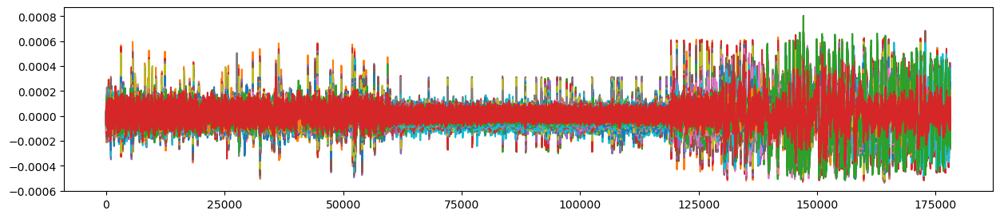

In [4]:
data = subject1.get_data()
plt.figure(figsize=(15,3))
plt.plot(data.T)
print(data)
print(data.shape)

plot data from EEG signal in frequency domain

Effective window size : 12.800 (s)


C:\Users\user\AppData\Local\Temp\ipykernel_7960\1785050501.py:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  subject1.compute_psd().plot();
c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


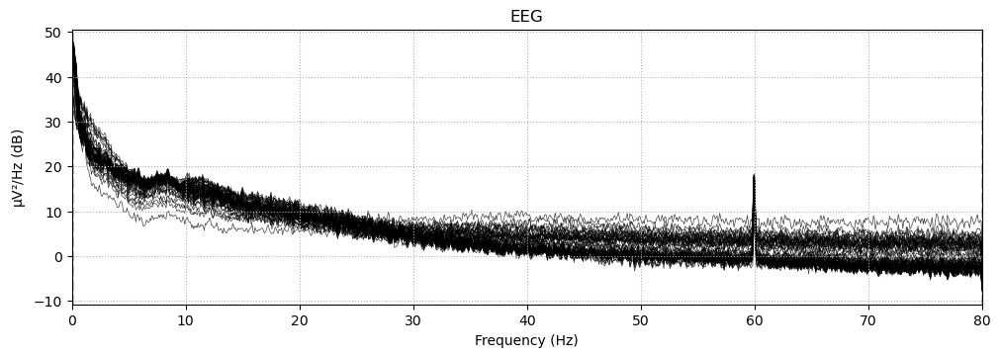

In [5]:
subject1.compute_psd().plot();

Map channel label with signal 

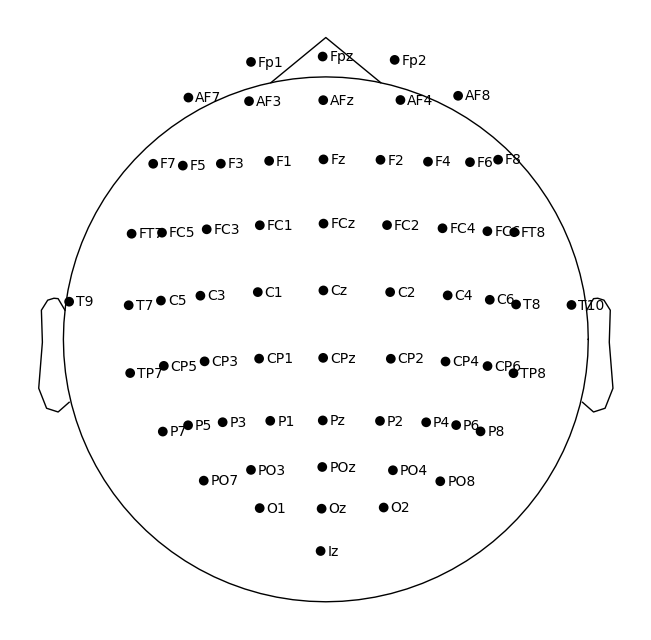

In [6]:
with open("Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/wfdbcal", "r") as file:
    content = file.readlines()
    
chan_name = []
chan_order = []
chan_mapping = {}
order = 1

for line in content:
    parts = line.split('\t')
    channel_name = parts[0].strip()
    channel_name = channel_name.replace(".", "")
    chan_name.append(channel_name)
    order_name = "# " + str(order)
    chan_order.append(order_name)
    chan_mapping[order_name] = channel_name
    order += 1 

channel_names = [chan_mapping[f'# {i+1}'] for i in range(64)]
old_ch_names = subject1.info['ch_names']

subject1.rename_channels({old: new for old, new in zip(old_ch_names, channel_names)})

# Set montage
# montage = mne.channels.make_standard_montage('standard_1020')
subject1.set_montage(montage = mne.channels.make_standard_montage('standard_1020'))

# Plot channel locations
subject1.plot_sensors(show_names=True);

plot topographic maps

Effective window size : 12.800 (s)


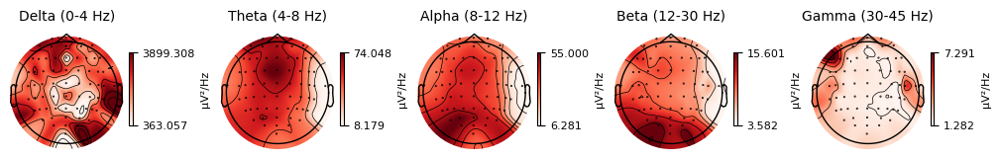

In [7]:
subject1.compute_psd().plot_topomap();

## **Re-referencing**

Original data of brain signal (64 channels)

Effective window size : 12.800 (s)


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


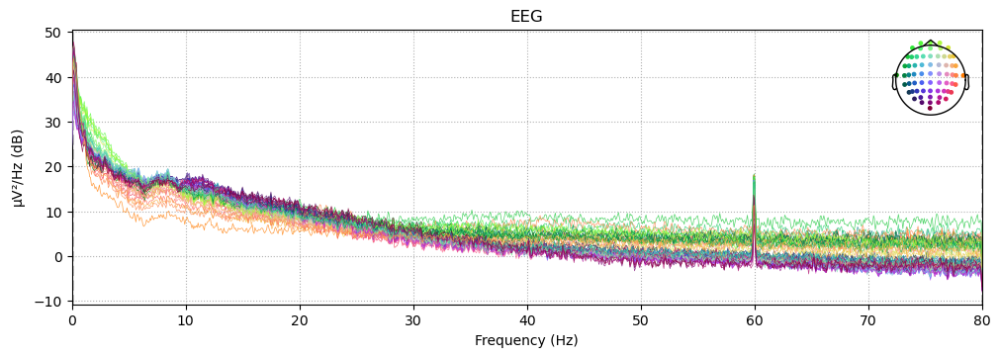

In [8]:
subject1.compute_psd().plot();

**Common Average Reference (CAR)** for re-referancing signal 64 channels

In [9]:
streams = subject1.copy().set_eeg_reference('average', projection=True)
streams.apply_proj()

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...


Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,0.00 Hz
Lowpass,80.00 Hz


Once re-referencing is done, it's apparent that there are channels moving closer to other graphs, as seen clearly. For instance, the purple graph overlaps and closely aligns with other graphs significantly.

Effective window size : 12.800 (s)


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


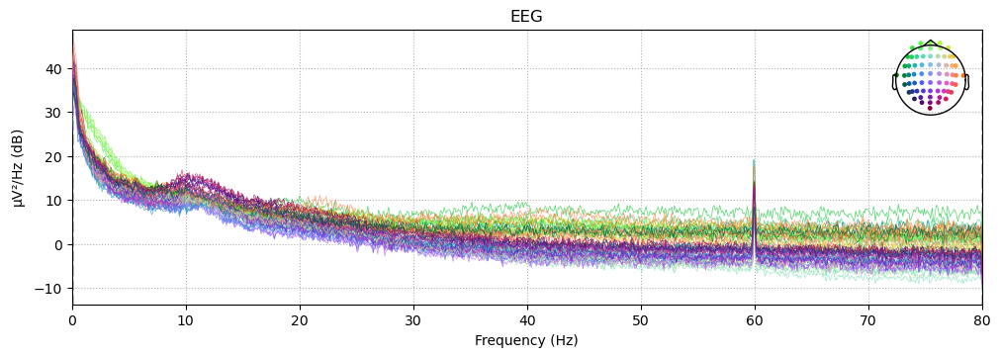

In [10]:
streams.compute_psd().plot();

## **Filtering**

**Infinite Impulse Response (IIR)** for filtering signal
- Butterworth Filters and 6 order
- Low frequency = 0.0
- High frequency = 50.0

In [11]:
stream_filter = streams.copy().filter(l_freq=8.0, h_freq=15.0, method = 'iir', iir_params= {"order": 6, "ftype":'butter'})

Filtering raw data in 9 contiguous segments
Setting up band-pass filter from 8 - 15 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:


- Filter order 24 (effective, after forward-backward)
- Cutoffs at 8.00, 15.00 Hz: -6.02, -6.02 dB



Effective window size : 12.800 (s)


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


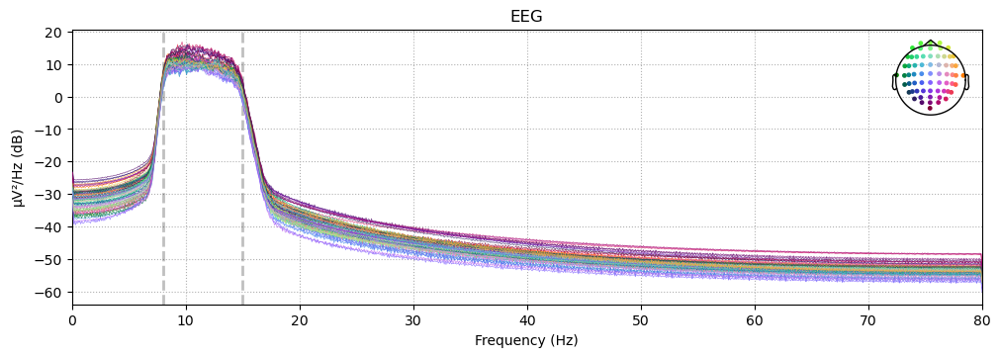

In [12]:
stream_filter.compute_psd().plot();

In [13]:
stream_filter.plot();

## **Artifact rejection and correction**

**Independent Component Analysis (ICA)** for remove artifact from eye blink or other artifact 

In [14]:
ica = mne.preprocessing.ICA(n_components=63, random_state=97, max_iter=800)

In [15]:
ica.fit(stream_filter.copy())

Fitting ICA to data using 64 channels (please be patient, this may take a while)
    Applying projection operator with 1 vector (pre-whitener computation)
    Applying projection operator with 1 vector (pre-whitener application)
Selecting by number: 63 components
    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 16.3s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=800
Fit,94 iterations on raw data (178080 samples)
ICA components,63
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


plot topographies of the ICA components to observe and identify which components are likely to be artifacts, in order to use them for removing those specific components, for the purpose of artifact removal

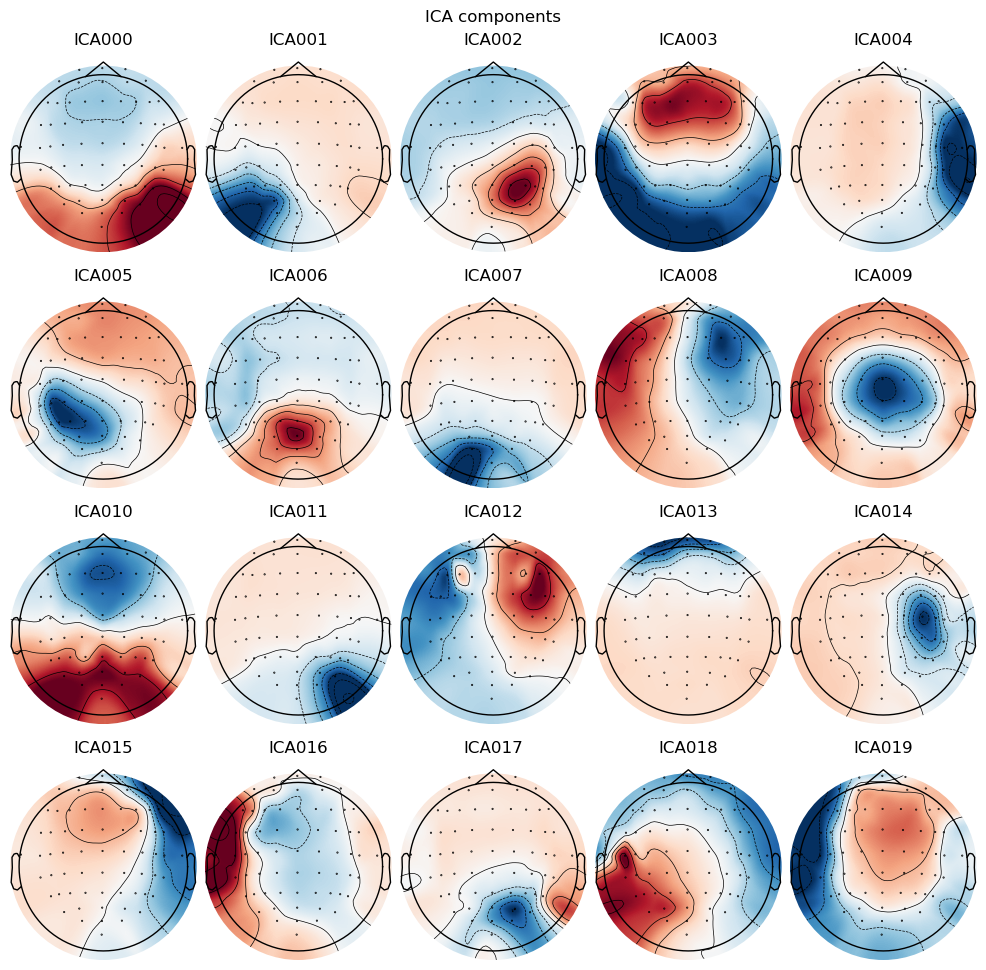

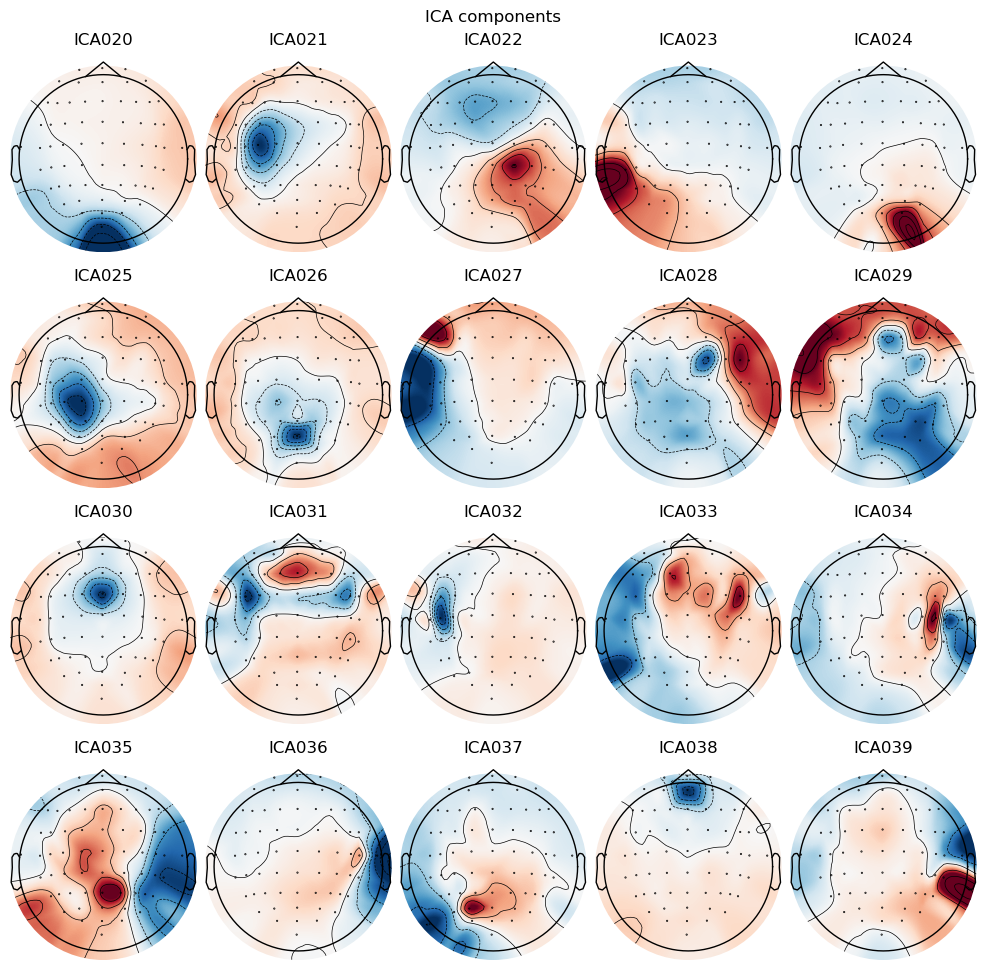

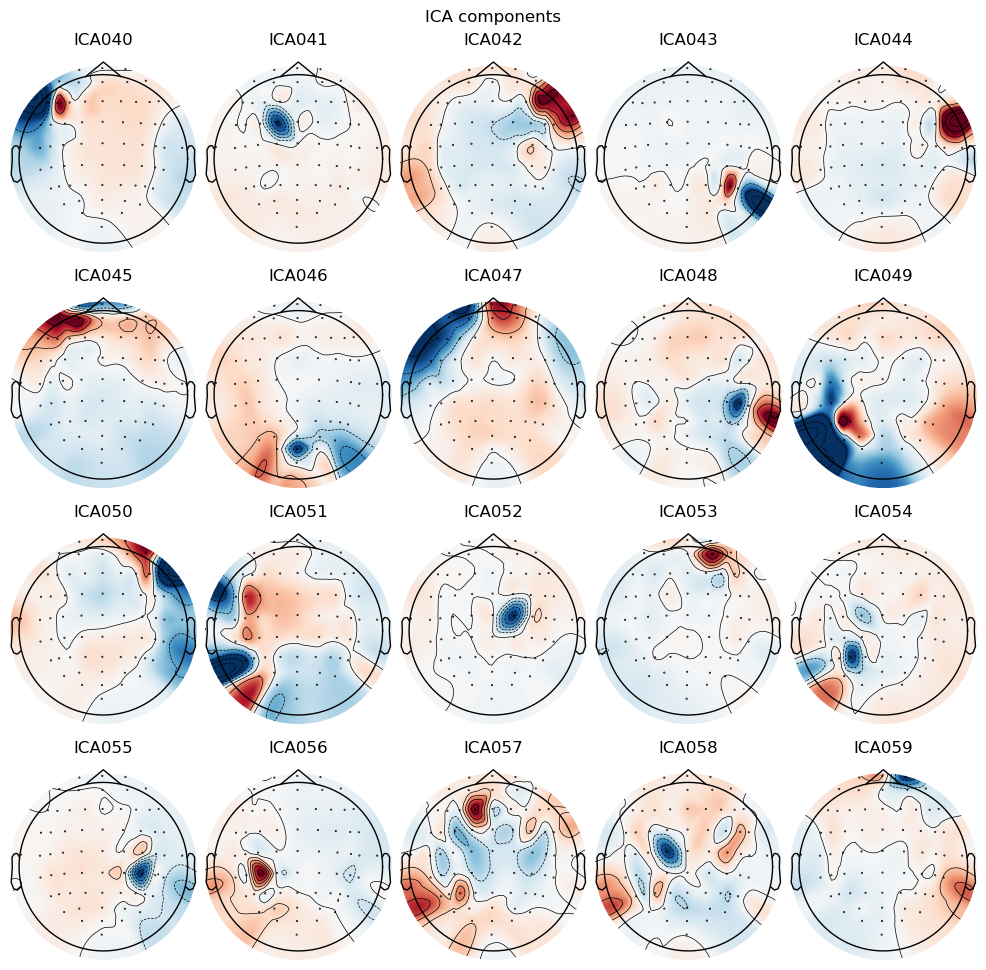

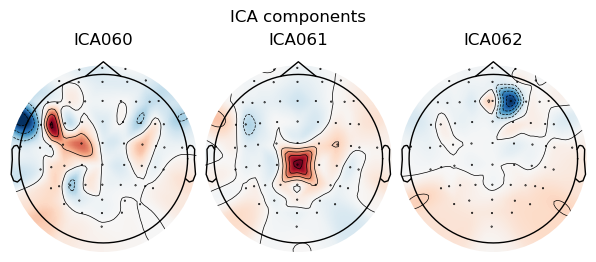

In [16]:
ica.plot_components();

Find bad component or artifact component by visual inspection and remove it from the data

In [17]:
bad_idx, scores = ica.find_bads_eog(stream_filter.copy(), ch_name='T9', threshold=1.5)

Using EOG channel: T9


    Applying projection operator with 1 vector (pre-whitener application)
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1600 samples (10.000 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1600 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Check bad component from signal in time domain to verify the accuracy of signals eligible to be artifacts.

In [18]:
print(bad_idx)

[16, 3, 19, 9, 8, 27, 12, 6, 13, 2, 31, 32, 4, 34]


In [19]:
ica.plot_sources(stream_filter.copy());

    Applying projection operator with 1 vector (pre-whitener application)


Creating RawArray with float64 data, n_channels=63, n_times=178080
    Range : 0 ... 178079 =      0.000 ...  1112.994 secs
Ready.


In [20]:
ica.exclude = bad_idx

In [21]:
stream_filter.plot();

Remove the bad ICA components from the data

In [22]:
stream_ica = ica.apply(stream_filter.copy(),exclude=ica.exclude)
stream_ica.plot();

Applying ICA to Raw instance
    Applying projection operator with 1 vector (pre-whitener application)
    Transforming to ICA space (63 components)
    Zeroing out 14 ICA components
    Projecting back using 64 PCA components


In [23]:
ica.plot_sources(stream_filter.copy());

    Applying projection operator with 1 vector (pre-whitener application)
Creating RawArray with float64 data, n_channels=63, n_times=178080
    Range : 0 ... 178079 =      0.000 ...  1112.994 secs
Ready.


## **Epoch segmentation**

### **Event marker**

Each event from signal
- T0 = rest
- T1 = Left hand motor imagery
- T2 = Right hand motor imagery

In [24]:
events, event_dict = mne.events_from_annotations(stream_filter)
print(event_dict)

Used Annotations descriptions: ['T0', 'T1', 'T2']
{'T0': 1, 'T1': 2, 'T2': 3}


Frequency of events

In [25]:
print(stream_filter.info["sfreq"])

160.0


Plot event markers : x-axis is time in seconds and y-axis is the event id

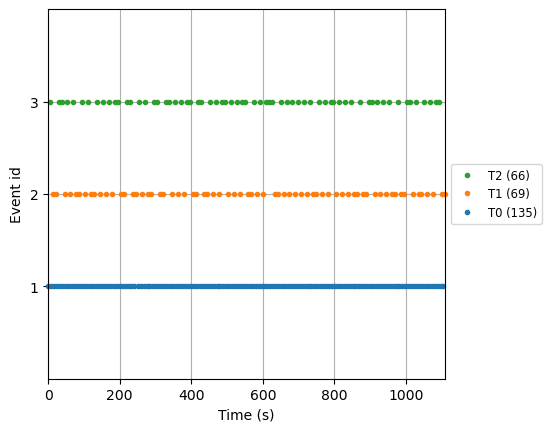

C:\Users\user\AppData\Local\Temp\ipykernel_7960\234485562.py:7: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


In [26]:
fig = mne.viz.plot_events(
    events, sfreq=stream_filter.info["sfreq"], first_samp=stream_filter.first_samp, event_id= event_dict
)
ax = fig.axes[0]
x_lim_seconds = [10, 20]
ax.set_xlim(x_lim_seconds)
fig.show()

### **Epochs**

Epochs segmentation for segment signal around event

In [27]:
# Epoch data based on a subset of interested events
event_selected = {'left': 2, 'right': 3}

stream_epochs = mne.Epochs(stream_ica.copy().filter(l_freq=8, h_freq=15.0, method = 'iir', iir_params= {"order": 6, "ftype":'butter'}), events, tmin = -2.0, tmax = 5, 
                    event_id = event_selected, preload= True, verbose=False, event_repeated='drop')

Filtering raw data in 9 contiguous segments
Setting up band-pass filter from 8 - 15 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 24 (effective, after forward-backward)
- Cutoffs at 8.00, 15.00 Hz: -6.02, -6.02 dB



In [28]:
stream_epochs

Number of events,126
Events,left: 63right: 63
Time range,-2.000 – 5.000 s
Baseline,-2.000 – 0.000 s


In [29]:
stream_epochs.info

Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,8.00 Hz
Lowpass,15.00 Hz


plot image of the epochs of each channel and each target(event)

In [30]:
# stream_epochs["rest"].plot(n_epochs = 10);

Not setting metadata
63 matching events found
No baseline correction applied
0 projection items activated


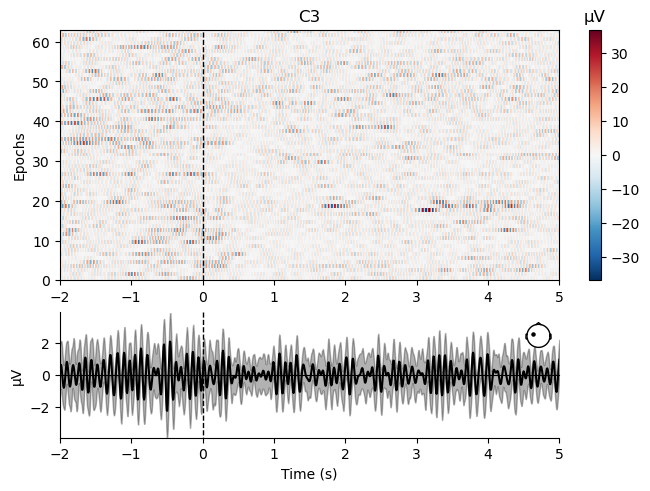

Not setting metadata
63 matching events found
No baseline correction applied
0 projection items activated


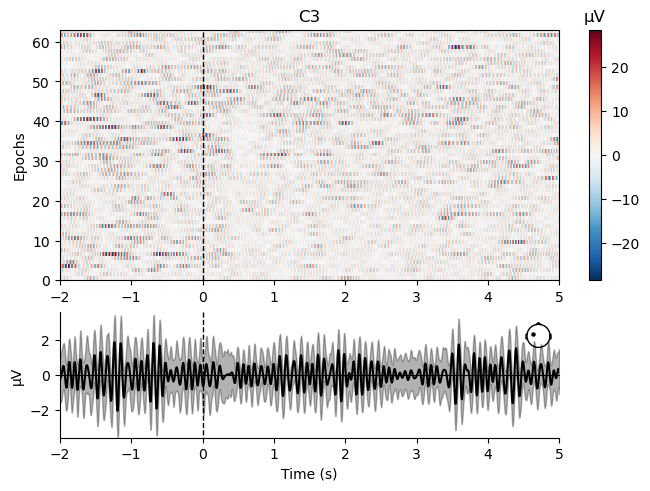

In [31]:
# stream_epochs["rest"].plot_image(picks = "C3");
stream_epochs["left"].plot_image(picks = "C3");
stream_epochs["right"].plot_image(picks = "C3");

Not setting metadata
63 matching events found


No baseline correction applied
0 projection items activated


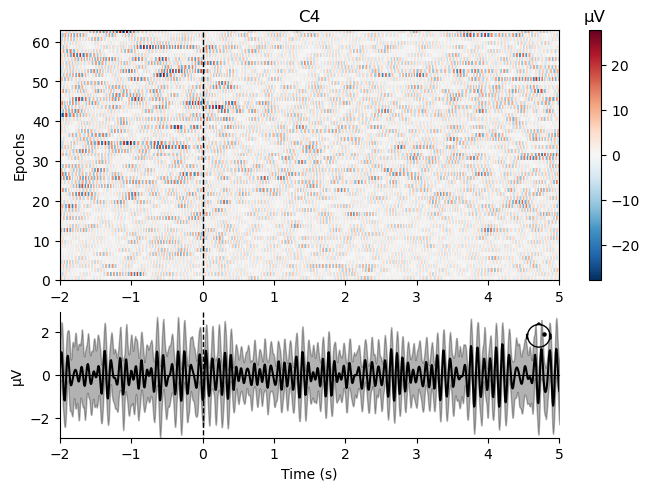

Not setting metadata
63 matching events found
No baseline correction applied
0 projection items activated


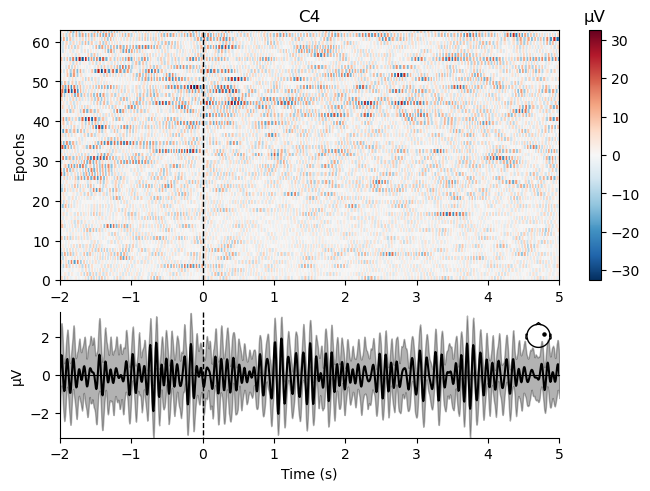

In [32]:
# stream_epochs["rest"].plot_image(picks = "C4");
stream_epochs["left"].plot_image(picks = "C4");
stream_epochs["right"].plot_image(picks = "C4");

Not setting metadata
63 matching events found
No baseline correction applied
0 projection items activated


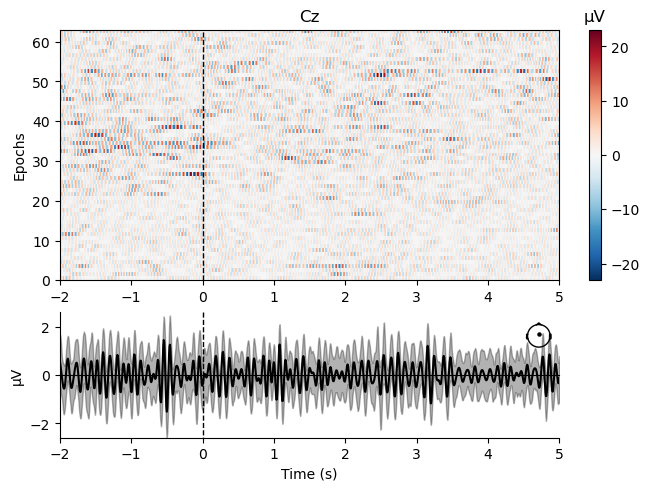

Not setting metadata
63 matching events found
No baseline correction applied
0 projection items activated


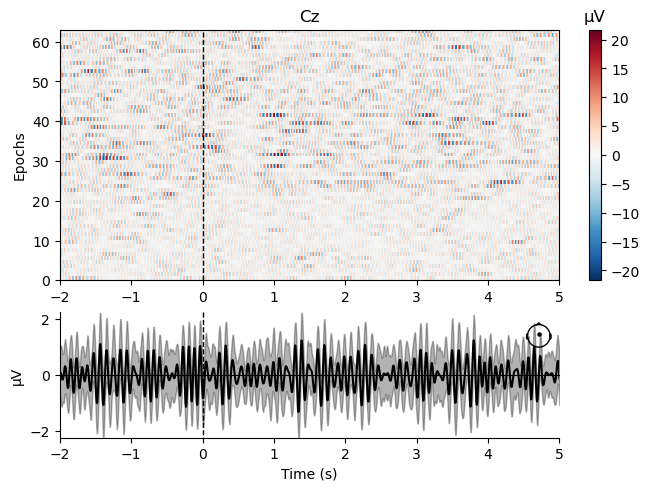

In [33]:
# stream_epochs["rest"].plot_image(picks = "Cz");
stream_epochs["left"].plot_image(picks = "Cz");
stream_epochs["right"].plot_image(picks = "Cz");

In [34]:
stream_epochs.to_data_frame()

,time,condition,epoch,FC5,FC3,FC1,FCz,FC2,FC4,FC6,...,P8,PO7,PO3,POz,PO4,PO8,O1,Oz,O2,Iz
0,-2.00000,right,1,-0.499714,-1.244452,-2.809700,-2.713630,-4.459120,-0.755867,3.443501,...,1.016716,-5.821644,-3.721179,0.220877,0.510001,1.569871,-1.997154,0.837692,3.757669,0.137728
1,-1.99375,right,1,-0.926894,-2.150215,-3.355594,-2.148676,-2.447653,1.664058,4.776706,...,4.422167,-7.954291,-5.426936,-0.394275,3.139793,5.479305,-5.209666,-2.478446,3.234461,-1.187222
2,-1.98750,right,1,-1.048946,-2.568656,-3.079303,-1.045760,0.124934,3.889610,5.347469,...,6.786266,-9.539096,-7.084897,-1.384537,4.829512,7.882747,-8.380629,-5.710566,1.405609,-2.385863
3,-1.98125,right,1,-0.865324,-2.373976,-2.033416,0.310954,2.643670,5.375093,5.024017,...,7.491369,-9.952544,-8.053399,-2.488317,5.123383,8.156925,-10.582820,-8.186380,-1.497377,-3.373684
4,-1.97500,right,1,-0.447347,-1.577886,-0.437280,1.614679,4.541720,5.757956,3.853617,...,6.310163,-8.724382,-7.733960,-3.387261,3.915800,6.197646,-10.998649,-9.368903,-4.941292,-4.113482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141241,4.97500,left,267,-4.533238,-6.124099,-3.440234,-2.322271,-1.547578,-4.194106,-1.981983,...,1.592642,-3.969753,0.025260,7.269526,11.129537,13.509703,-2.568697,4.288444,9.615332,-1.914835
141242,4.98125,left,267,-3.967897,-6.927610,-7.186202,-5.167058,-3.902337,-5.385700,-2.185640,...,2.794859,-5.248658,0.062449,8.637759,12.637239,14.068785,-1.356592,5.246677,11.160093,-2.693704
141243,4.98750,left,267,-3.032499,-6.657585,-9.832505,-7.036095,-5.341299,-5.392947,-2.033814,...,3.518585,-5.576932,0.059418,8.632924,11.830033,12.032562,0.154891,5.411226,10.868046,-2.751626
141244,4.99375,left,267,-1.823667,-5.376367,-10.975485,-7.747952,-5.766387,-4.376730,-1.637478,...,3.611334,-4.590514,0.267303,7.463003,8.996138,7.902975,1.848431,4.833273,8.879922,-1.979334


Select some channel that relate with Motor Imagery (C3, Cz, C4) but select channel nearby C3, Cz and C4 as well ('C5','C3','C1','Cz','C2','C4','C6')

In [35]:
# Selected data from only the channels we are interested in
chans_selected = ['C5','C3','C1','Cz','C2','C4','C6']
stream_epochs = stream_epochs.pick_channels(chans_selected)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [36]:
stream_epochs.plot();

    Using multitaper spectrum estimation with 7 DPSS windows


Averaging across epochs...


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


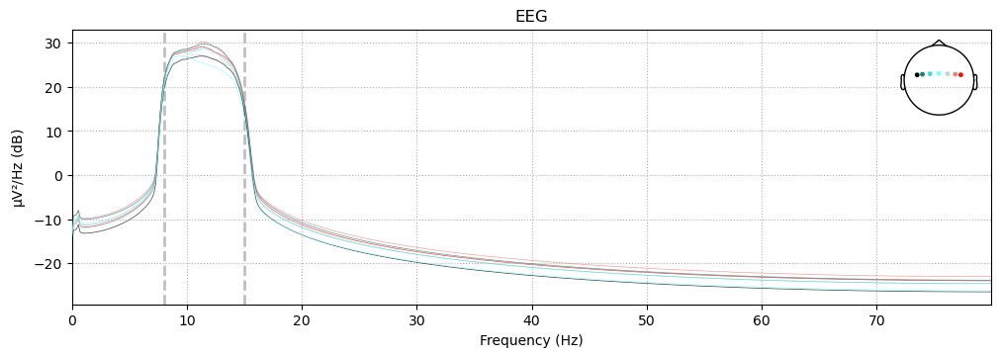

In [37]:
stream_epochs.compute_psd().plot();

## **Baseline Correction**

In [38]:
filt = stream_epochs.copy().filter(l_freq=0.0, h_freq=20.0, method = 'iir', iir_params= {"order": 6, "ftype":'butter'})
filt.plot();

Setting up low-pass filter at 20 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 12 (effective, after forward-backward)
- Cutoff at 20.00 Hz: -6.02 dB



In [39]:
stream_baseline = filt.copy().apply_baseline((-0.5, 0))
stream_baseline.plot();

Applying baseline correction (mode: mean)


## **Bad epochs**

### **Marking bad epochs**

In [40]:
reject = dict(eeg = 200e-6)

In [41]:
epochs = stream_baseline.copy() 
reject.update({'eeg': 150e-6})
epochs.drop_bad(reject = reject)

0 bad epochs dropped


Number of events,126
Events,left: 63right: 63
Time range,-2.000 – 5.000 s
Baseline,-0.500 – 0.000 s


### **Tuning rejection thresholds**

In [42]:
import matplotlib.pyplot as plt
from ipywidgets import interact

pick = mne.pick_types(epochs.info, meg=False, eeg=True)

def reject_epochs(reject):
    reject = dict(eeg=reject*1e-6)
    evoked = epochs.copy().drop_bad(reject=reject, verbose=False).average()
    evoked.plot(spatial_colors=True, gfp=True, time_unit='s')
    print('Number of epochs retained: %d%d' % (evoked.nave, len(epochs)))

In [43]:
interact(reject_epochs, reject=(35, 250, 10));

interactive(children=(IntSlider(value=135, description='reject', max=250, min=35, step=10), Output()), _dom_cl…

### **Autoreject**

In [44]:
import autoreject

In [45]:
from autoreject import get_rejection_threshold
reject = get_rejection_threshold(epochs)  
print(reject)

Estimating rejection dictionary for eeg
{'eeg': 7.348487556534919e-05}


## **Analysis ERD and ERS for MI**

Segmentation signal (epoch) from analysis ERD and ERS to observe whether the collected signals from volunteers can be utilized and to discern the differences between Left Hand Motor Imagery and Right Hand Motor Imagery. 

Effective window size : 12.800 (s)


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


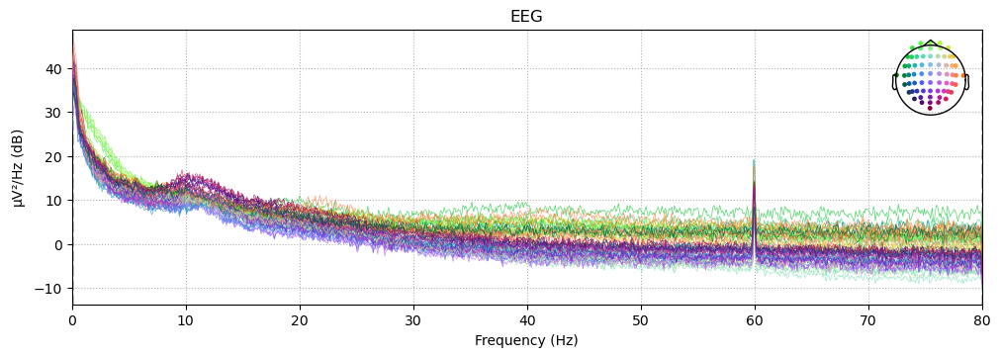

In [46]:
streams.compute_psd().plot();

In [47]:
ERD_ERS = subject1.copy()
ERD_ERS.annotations.rename(dict(T1="left", T2="right"))

tmin, tmax = -2.0, 8.0
event_selected = {'left': 2, 'right': 3}  # map event IDs to tasks
event_ids = dict(left=2, right=3)

epochs_ERD_ERS = mne.Epochs(
    ERD_ERS,
    events,
    event_id=event_selected,
    tmin = -2.0, tmax = 6.0,
    picks=("C3", "Cz", "C4"),
    baseline=None,
    preload=True, verbose=False, event_repeated='drop'
)

In [48]:
epochs_ERD_ERS.plot();

In [49]:
freqs = np.arange(2, 36)  # frequencies from 2-35Hz
vmin, vmax = -1, 1.5  # set min and max ERDS values in plot
baseline = (-1, 0)  # baseline interval (in s)
cnorm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)  # min, center & max ERDS

kwargs = dict(
    n_permutations=100, step_down_p=0.05, seed=1, buffer_size=None, out_type="mask"
)  # for cluster test

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s remaining:    0.0s


Not setting metadata
Applying baseline correction (mode: percent)
Using a threshold of 1.669804
stat_fun(H1): min=-4.657096 max=4.475438
Running initial clustering …
Found 153 clusters


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
C:\Users\user\AppData\Local\Temp\ipykernel_7960\1154884502.py:13: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.time_frequency.tfr.EpochsTFR'>.tmax (6 s)
  tfr.crop(tmin, tmax).apply_baseline(baseline, mode="percent")


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 4 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.669804
stat_fun(H1): min=-4.657096 max=4.475438
Running initial clustering …
Found 74 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.669804
stat_fun(H1): min=-7.968840 max=4.475435
Running initial clustering …
Found 94 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.669804
stat_fun(H1): min=-7.968840 max=4.475435
Running initial clustering …
Found 35 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.669804
stat_fun(H1): min=-4.435555 max=4.059298
Running initial clustering …
Found 170 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #4 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.669804
stat_fun(H1): min=-4.435555 max=4.059298
Running initial clustering …
Found 88 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
No baseline correction applied


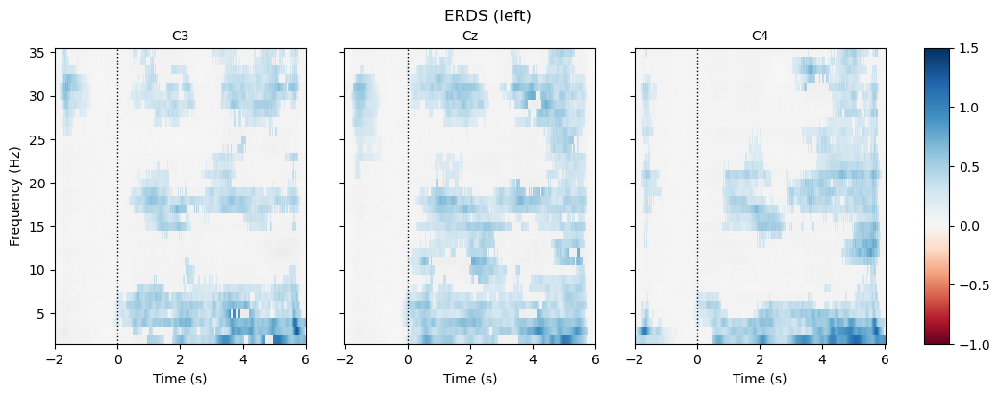

Using a threshold of 1.669804
stat_fun(H1): min=-3.853471 max=4.220503
Running initial clustering …
Found 197 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 4 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.669804
stat_fun(H1): min=-3.853471 max=4.220503
Running initial clustering …
Found 87 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.669804
stat_fun(H1): min=-9.426294 max=4.342065
Running initial clustering …
Found 108 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 3 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.669804
stat_fun(H1): min=-9.426294 max=4.342065
Running initial clustering …
Found 49 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.669804
stat_fun(H1): min=-6.714066 max=4.329454
Running initial clustering …
Found 69 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 3 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 1 additional cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #3 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.669804
stat_fun(H1): min=-6.714066 max=4.329454
Running initial clustering …
Found 74 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 0 clusters to exclude from subsequent iterations
No baseline correction applied


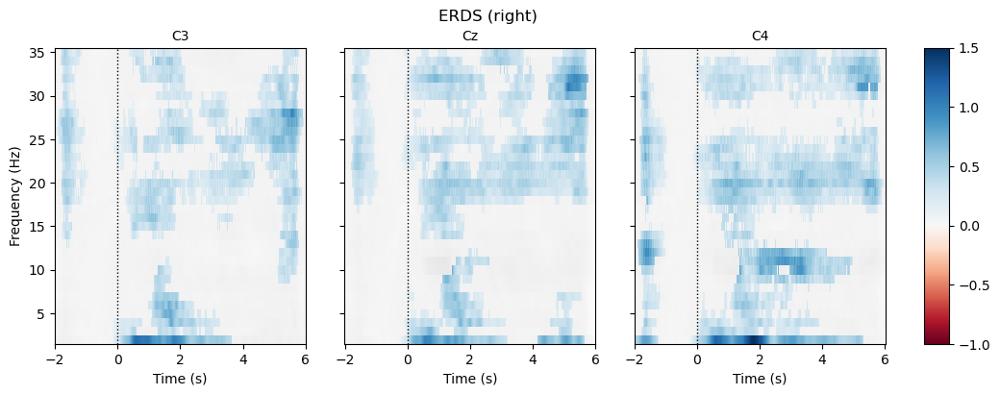

In [50]:
from mne.time_frequency import tfr_multitaper

tfr = tfr_multitaper(
    # method="multitaper",
    inst=epochs_ERD_ERS,
    freqs=freqs,
    n_cycles=freqs,
    use_fft=True,
    return_itc=False,
    average=False,
    decim=2,
)
tfr.crop(tmin, tmax).apply_baseline(baseline, mode="percent")

for event in event_ids:
    # select desired epochs for visualization
    tfr_ev = tfr[event]
    fig, axes = plt.subplots(
        1, 4, figsize=(12, 4), gridspec_kw={"width_ratios": [10, 10, 10, 1]}
    )
    for ch, ax in enumerate(axes[:-1]):  # for each channel
        # positive clusters
        _, c1, p1, _ = pcluster_test(tfr_ev.data[:, ch], tail=1, **kwargs)
        # negative clusters
        _, c2, p2, _ = pcluster_test(tfr_ev.data[:, ch], tail=-1, **kwargs)

        # note that we keep clusters with p <= 0.05 from the combined clusters
        # of two independent tests; in this example, we do not correct for
        # these two comparisons
        c = np.stack(c1 + c2, axis=2)  # combined clusters
        p = np.concatenate((p1, p2))  # combined p-values
        mask = c[..., p <= 0.05].any(axis=-1)

        # plot TFR (ERDS map with masking)
        tfr_ev.average().plot(
            [ch],
            cmap="RdBu",
            cnorm=cnorm,
            axes=ax,
            colorbar=False,
            show=False,
            mask=mask,
            mask_style="mask",
        )

        ax.set_title(epochs_ERD_ERS.ch_names[ch], fontsize=10)
        ax.axvline(0, linewidth=1, color="black", linestyle=":")  # event
        if ch != 0:
            ax.set_ylabel("")
            ax.set_yticklabels("")
    fig.colorbar(axes[0].images[-1], cax=axes[-1]).ax.set_yscale("linear")
    fig.suptitle(f"ERDS ({event})")
    plt.show()


From the graph, it can be observed that during rest, Event-Related Synchronization (ERS) occurs throughout the graph, including in C3, Cz, and C4. However, in the Left Hand Motor Imagery (MI) event, ERS is noticeable at CZ and C4. Specifically, in C4, it occurs at the 5-second mark and within the frequency range of 15 - 30 Hz, which aligns with the typical alpha (8-13 Hz) or beta (13-30 Hz) ranges often analyzed in MI studies. This suggests that the signal generated stems from left hand motor imagery. Conversely, in Right Hand MI, ERS is observed in C3, CZ, and C4. In C3, it occurs at the 5-second mark and within the frequency range of 20 - 30 Hz, while in C4, it is present from 0 to 6 seconds. This implies that the signal generated is likely from right hand motor imagery.

In [51]:
df = tfr.to_data_frame(time_format=None)
df.head()

,time,freq,epoch,condition,C3,Cz,C4
0,-2.0000,2.0,1,right,-0.917519,-0.958123,-0.983238
1,-1.9875,2.0,1,right,-0.912334,-0.957735,-0.982780
2,-1.9750,2.0,1,right,-0.905922,-0.956666,-0.981920
3,-1.9625,2.0,1,right,-0.901877,-0.955353,-0.980109
4,-1.9500,2.0,1,right,-0.900107,-0.953387,-0.976673


## **spontaneous**

In [52]:
filter_st = stream_baseline.copy().filter(l_freq=0.0, h_freq=15.0, method = 'iir', iir_params= {"order": 7, "ftype":'butter'})

chans_selected = ['C5','C3','C1','Cz','C2','C4','C6']
epochs = filter_st.pick_channels(chans_selected)

Setting up low-pass filter at 15 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 14 (effective, after forward-backward)
- Cutoff at 15.00 Hz: -6.02 dB

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [53]:
# rest_epochs = epochs["rest"].average()
# rest_epochs

In [54]:
left_epochs = epochs["left"].average()
left_epochs

Condition,left
Data kind,average
Timepoints,1121 samples
Channels,7 channels
Number of averaged epochs,63
Time range (secs),-2.0 – 5.0
Baseline (secs),-0.500 – 0.000 s


In [55]:
right_epochs = epochs["right"].average()
right_epochs

Condition,right
Data kind,average
Timepoints,1121 samples
Channels,7 channels
Number of averaged epochs,63
Time range (secs),-2.0 – 5.0
Baseline (secs),-0.500 – 0.000 s


In [56]:
epochs.get_data().shape

C:\Users\user\AppData\Local\Temp\ipykernel_7960\2796709754.py:1: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  epochs.get_data().shape


(126, 7, 1121)

To create plots of signals within different events by averaging each event across all channels ('C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6') to observe the differences in signals occurring in each event and each channel.

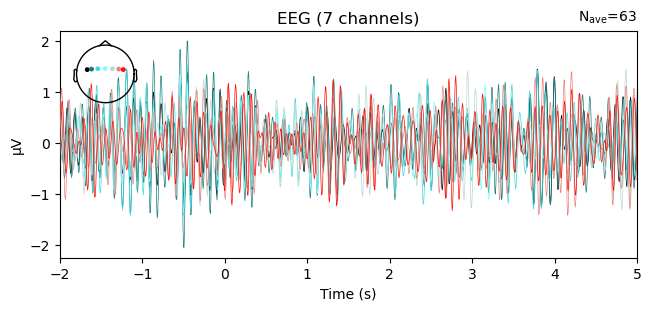

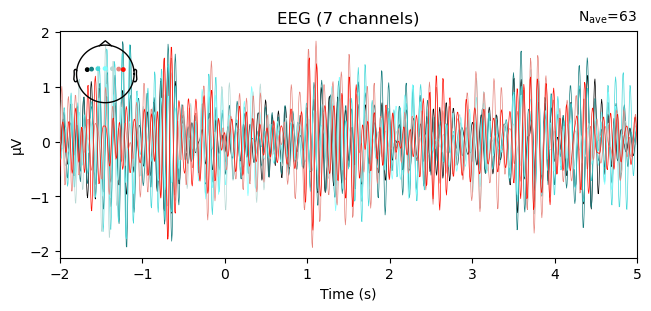

In [57]:
# rest_epochs.plot();
left_epochs.plot();
right_epochs.plot();

Plot topographie in duration 0, 1, 2, 3, 4, 5 and 6 second

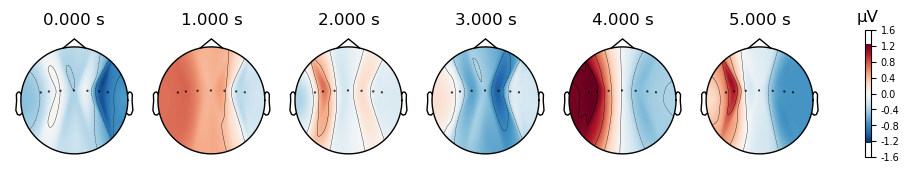

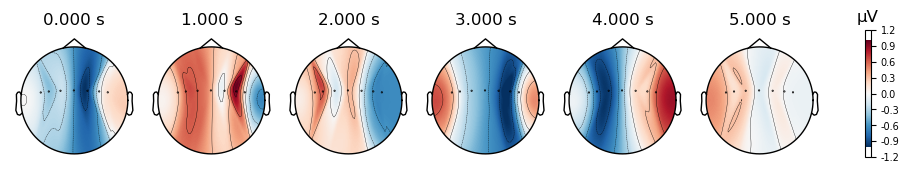

In [58]:
# rest_epochs.plot_topomap(times=[0, 1, 2, 3, 4, 5, 6]);
left_epochs.plot_topomap(times=[0, 1, 2, 3, 4, 5]);
right_epochs.plot_topomap(times=[0, 1, 2, 3, 4, 5]);

Combined between graph and topographie

Projections have already been applied. Setting proj attribute to True.


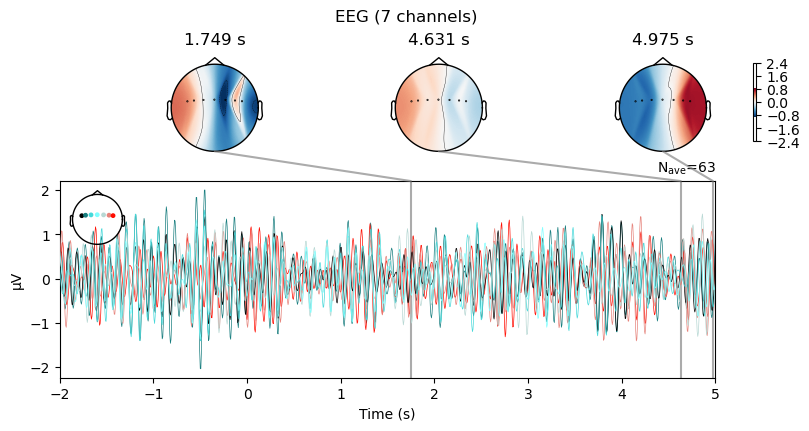

Projections have already been applied. Setting proj attribute to True.


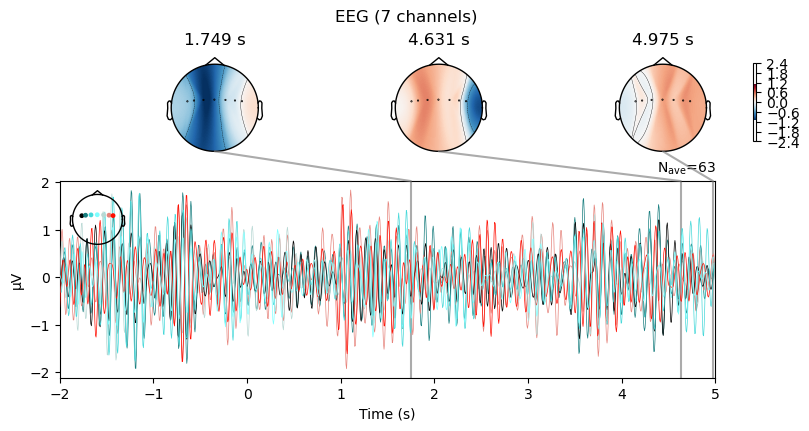

In [59]:
# rest_epochs.plot_joint(times=[2.431, 2.981, 4.781]);
left_epochs.plot_joint(times=[1.749, 4.631, 4.975]);
right_epochs.plot_joint(times=[1.749, 4.631, 4.975]);

From the graph, it can be observed that around the 5-second mark, during the Left Hand Motor Imagery (MI), there is brain signal stimulation occurring in the right hemisphere, indicated by the presence of red in that area. Conversely, during the Right Hand MI, brain signal stimulation occurs in the left hemisphere, as indicated by the red coloration in that region.

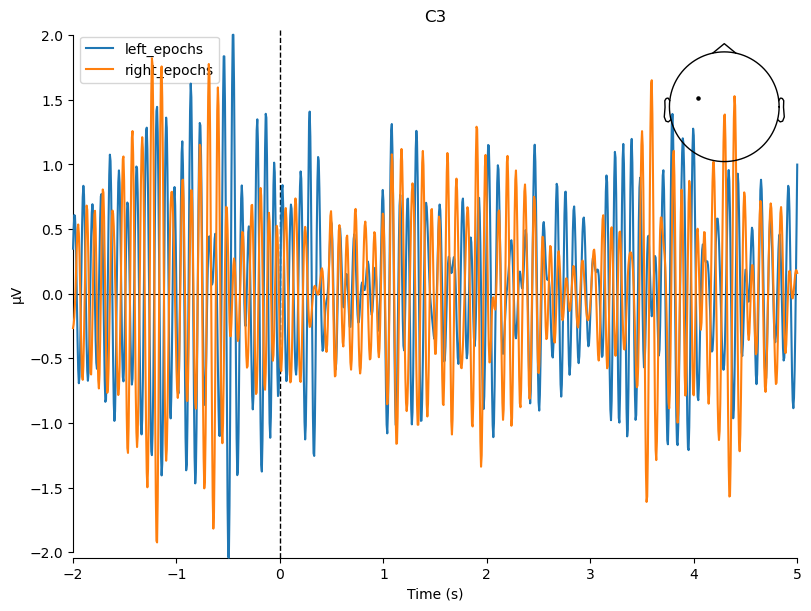

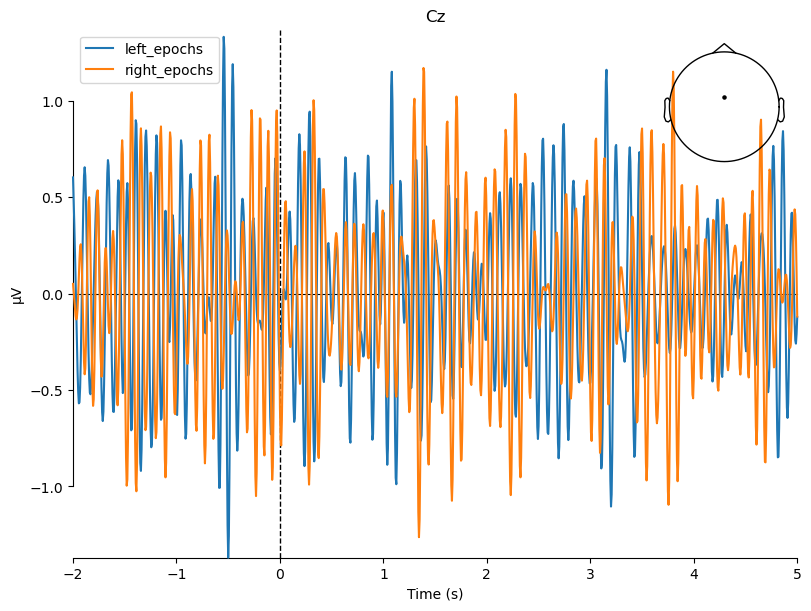

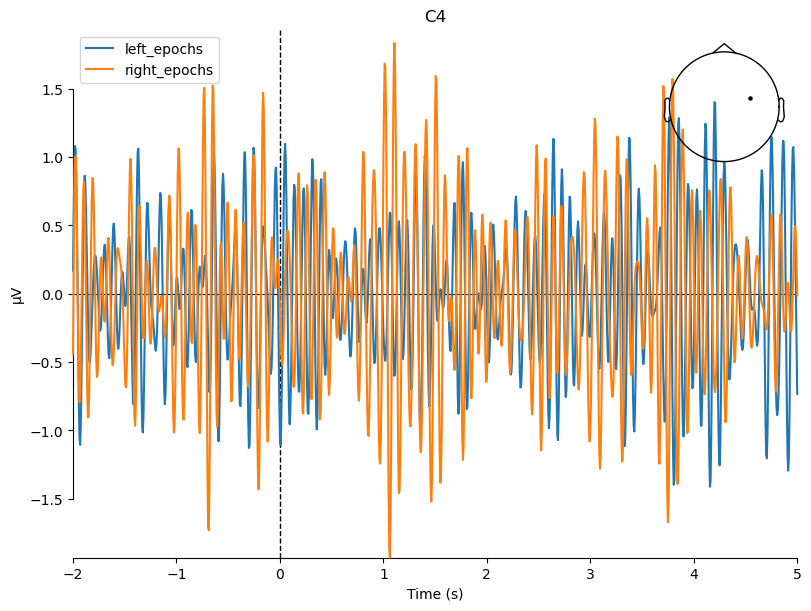

In [60]:
mne.viz.plot_compare_evokeds(
    {"left_epochs" :left_epochs,"right_epochs" : right_epochs},
    picks="C3",
);
mne.viz.plot_compare_evokeds(
    {"left_epochs" :left_epochs,"right_epochs" : right_epochs},
    picks="Cz",
);
mne.viz.plot_compare_evokeds(
    {"left_epochs" :left_epochs,"right_epochs" : right_epochs},
    picks="C4",
);

## **Time-frequency domain analysis**

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


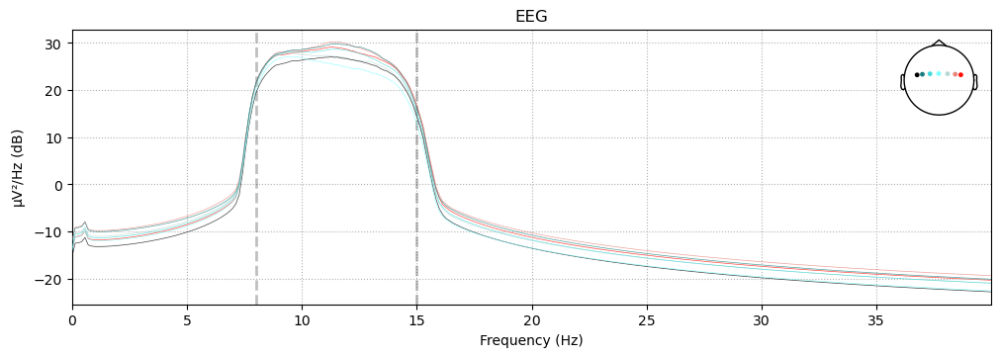

In [61]:
epochs_for_tfr = stream_epochs.copy()
epochs_for_tfr.plot_psd(fmin=0, fmax=40);

In [62]:
from mne.time_frequency import tfr_morlet

In [63]:
freqs = list(range(7, 15))  # frequencies from 2-35Hz
# tfr_rest = tfr_morlet(epochs_for_tfr["rest"], freqs=freqs, n_cycles=3, return_itc=False)
tfr_left = tfr_morlet(epochs_for_tfr["left"], freqs=freqs, n_cycles=3, return_itc=False)
tfr_right = tfr_morlet(epochs_for_tfr["right"], freqs=freqs, n_cycles=3, return_itc=False)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s finished


In [64]:
tfr_contrast = mne.combine_evoked([tfr_left], weights=[1])
tfr_contrast.apply_baseline((-0.5, 0))

Applying baseline correction (mode: mean)


<AverageTFR | time : [-2.000000, 5.000000], freq : [7.000000, 14.000000], nave : 63, channels : 7, ~536 kB>

No baseline correction applied
No baseline correction applied


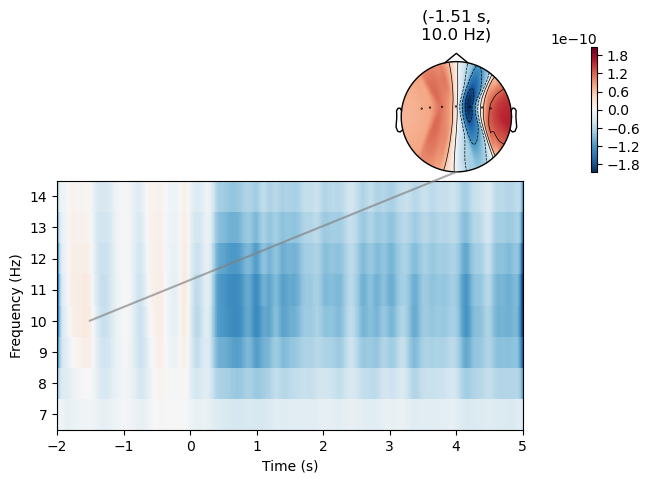

In [65]:
tfr_contrast.plot_joint();

In [66]:
tfr_contrast = mne.combine_evoked([tfr_right], weights=[1])
tfr_contrast.apply_baseline((-0.5, 0))

Applying baseline correction (mode: mean)


<AverageTFR | time : [-2.000000, 5.000000], freq : [7.000000, 14.000000], nave : 63, channels : 7, ~536 kB>

No baseline correction applied
No baseline correction applied


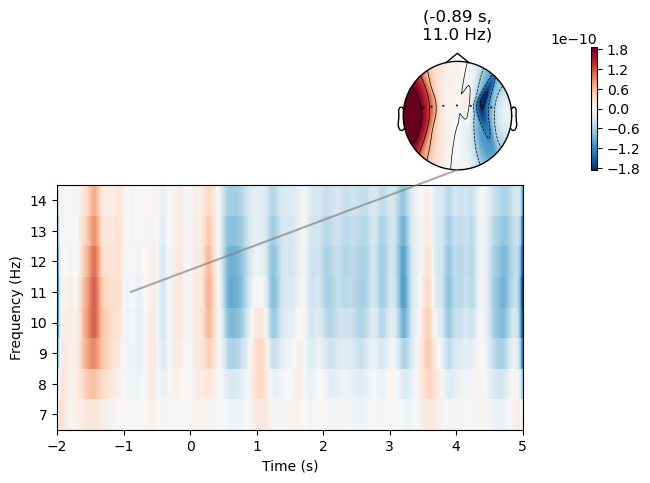

In [67]:
tfr_contrast.plot_joint();

No baseline correction applied


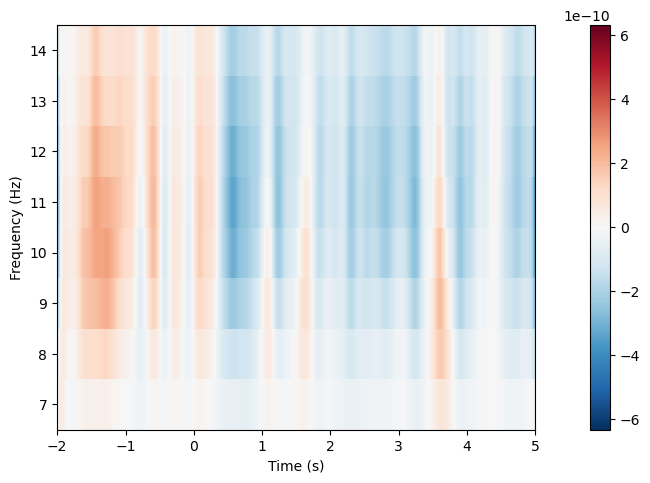

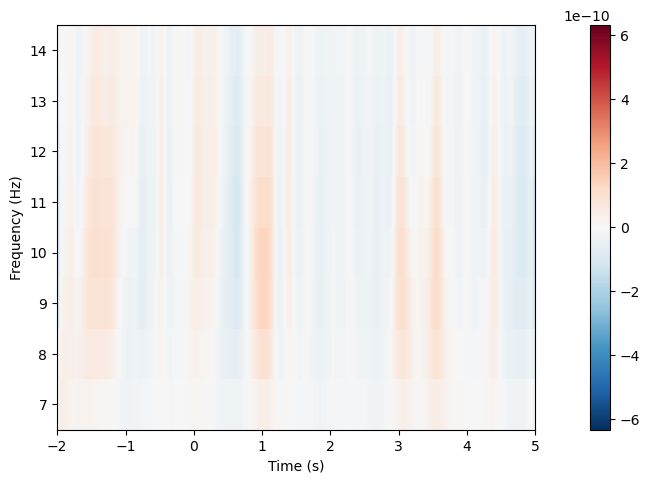

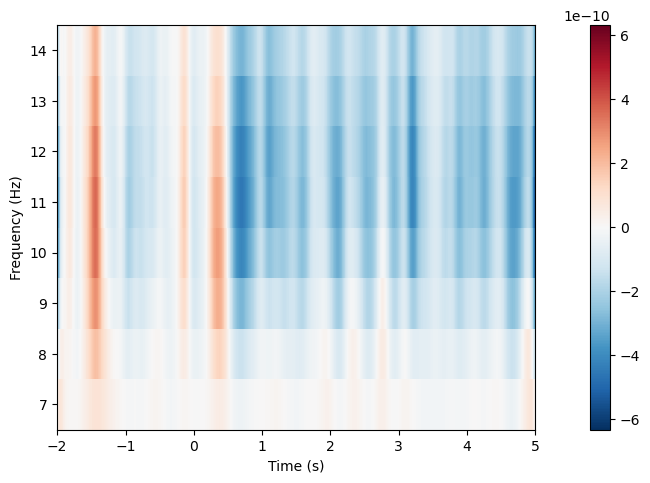

In [68]:
tfr_contrast.plot(picks = ["C3", "Cz", "C4"]);

# **Feature Extraction CSP**

In [69]:
from mne.decoding import CSP
from sklearn.model_selection import train_test_split, cross_val_score

In [70]:
epochs_mi = stream_baseline.copy()

EEG data shape: (126, 7, 1121)
events shape  : (126,)
Computing rank from data with rank=None
    Using tolerance 3.5e-06 (2.2e-16 eps * 7 dim * 2.2e+09  max singular value)
    Estimated rank (mag): 7
    MAG: rank 7 computed from 7 data channels with 0 projectors
Reducing data rank from 7 -> 7
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 3.5e-06 (2.2e-16 eps * 7 dim * 2.3e+09  max singular value)
    Estimated rank (mag): 7
    MAG: rank 7 computed from 7 data channels with 0 projectors
Reducing data rank from 7 -> 7
Estimating covariance using EMPIRICAL
Done.


C:\Users\user\AppData\Local\Temp\ipykernel_7960\449600257.py:2: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  X = epochs_mi.get_data()


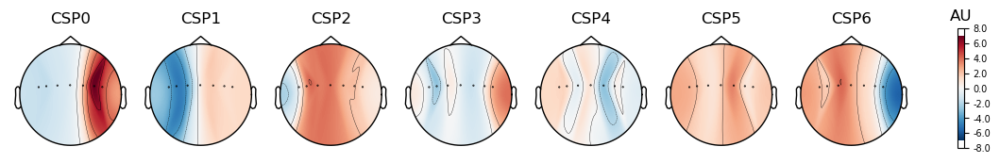

CSP({'component_order': 'mutual_info',
 'cov_est': 'concat',
 'cov_method_params': None,
 'log': None,
 'n_components': 7,
 'norm_trace': False,
 'rank': None,
 'reg': None,
 'transform_into': 'average_power'})


In [71]:
# Get EEG data and events
X = epochs_mi.get_data()
y = epochs_mi.events[:, -1]

print(f'EEG data shape: {X.shape}')
print(f'events shape  : {y.shape}')

# Initilize CSP
csp = CSP(n_components = 7, norm_trace = False)

# Fit CSP to data 
csp.fit(X, y)

# Visualize CSP patterns
csp.plot_patterns(epochs_mi.info);

print(csp)

In [72]:
X

array([[[-3.52982884e-06, -4.67949502e-06, -5.31898995e-06, ...,
         -1.00640954e-06, -2.49994650e-07,  5.27519969e-07],
        [-3.11085634e-06, -4.98782874e-06, -6.18953460e-06, ...,
         -2.80554622e-06, -1.59595922e-06, -2.28150157e-07],
        [-5.94863510e-07, -1.66386539e-06, -2.46003526e-06, ...,
         -4.91438101e-06, -3.25220656e-06, -1.15258413e-06],
        ...,
        [-5.04975214e-06, -3.31863536e-06, -1.59021300e-06, ...,
          1.74123864e-06,  4.80306300e-06,  7.66308633e-06],
        [-2.13917507e-06,  1.97811478e-06,  5.29945455e-06, ...,
         -1.69919608e-07,  1.10238036e-06,  2.42303830e-06],
        [ 1.77293457e-06,  5.50452702e-06,  8.23374431e-06, ...,
         -5.85373629e-07,  4.47350779e-07,  1.60165448e-06]],

       [[ 4.26245207e-06,  2.34356221e-06,  4.31627875e-07, ...,
          1.51184844e-06,  1.64002107e-06,  1.55387290e-06],
        [ 4.79924405e-06,  2.59973956e-06,  4.94212823e-07, ...,
          3.24953633e-06,  2.93974077e

In [73]:
y

array([3, 2, 2, 3, 3, 2, 3, 2, 3, 2, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3,
       3, 2, 2, 3, 3, 2, 3, 2, 3, 2, 2, 3, 3, 2, 2, 3, 3, 2, 3, 2, 2, 3,
       3, 2, 2, 3, 3, 2, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 3, 2, 2, 3,
       2, 3, 2, 3, 3, 2, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3,
       2, 3, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 2, 3, 3, 2, 3, 2, 3, 2, 3, 2,
       2, 3, 2, 3, 3, 2, 3, 2, 2, 3, 2, 3, 2, 3, 3, 2])

# **Feature Extraction Wavelet**

In [74]:
epochs_mi_WT = stream_epochs.copy()
print(epochs_mi_WT)

<Epochs |  126 events (all good), -2 – 5 s, baseline -2 – 0 s, ~7.6 MB, data loaded,
 'left': 63
 'right': 63>


c:\Anaconda\lib\site-packages\matplotlib\cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\Anaconda\lib\site-packages\matplotlib\cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0.5, 1.0, 'Sample Wavelets')

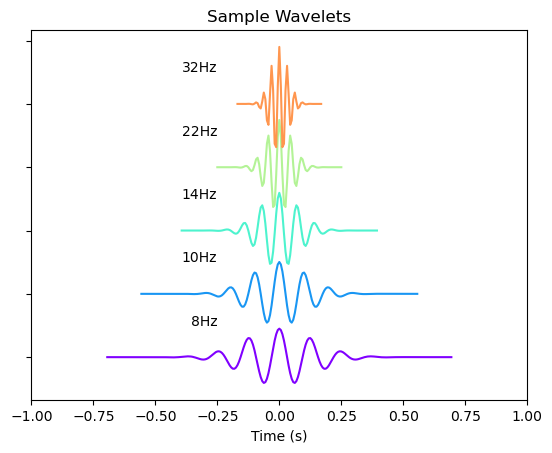

In [75]:
%matplotlib inline
# First we'll visualize a morlet wavelet:
fig, ax = plt.subplots()
wavelet_freqs=  [8, 10, 14, 22, 32]
cmap = plt.cm.rainbow
for ii, freq in enumerate(wavelet_freqs):
    wavelet = mne.time_frequency.morlet(epochs_mi_WT.info['sfreq'], [freq])[0]
    time = np.arange(len(wavelet)) / float(epochs_mi_WT.info['sfreq'])
    time -= time[len(time) // 2]
    color = cmap(float(ii) / len(wavelet_freqs))
    ax.plot(time, wavelet + .5 * ii, c=color)
    ax.text(-.25, .5 * ii + .25, '{}Hz'.format(freq), horizontalalignment='right')
    ax.set_xlim([-1, 1])
_ = plt.setp(ax.get_yticklabels(), visible=False)
ax.set_xlabel('Time (s)')
ax.set_title('Sample Wavelets')

In [76]:
high_freq = epochs_mi_WT.copy()
freqs = np.arange(8, 32)
etfr = mne.time_frequency.tfr_morlet(
    high_freq, freqs, picks=range(len(high_freq.ch_names)),
    n_cycles=freqs / 4., average=False, use_fft=True, return_itc=False)

# Now average across frequencies for a single time-varying amplitude
tfrs = etfr.data.mean(axis=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Not setting metadata


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.5s finished


Applying baseline correction (mode: zscore)


C:\Users\user\AppData\Local\Temp\ipykernel_7960\1962022070.py:7: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.Epochs'>.tmax (5 s)
  _ = high_freq.copy().crop(-2, 6).average().plot()


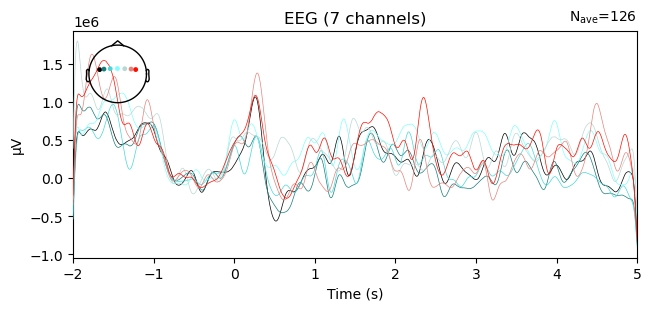

In [77]:
# We'll rescale the data so that it's in standard units above a baseline
high_freq._data = tfrs.copy()
_ = mne.baseline.rescale(high_freq._data, high_freq.times, (-.8, -.1),
                         mode='zscore', copy=False)

# Now plot
_ = high_freq.copy().crop(-2, 6).average().plot()

In [78]:
# Now, resample to save computation time / space
sfreq_new = 200
high_freq.resample(sfreq_new, npad='auto')

print(high_freq)


<Epochs |  126 events (all good), -2 – 5 s, baseline -2 – 0 s, ~9.5 MB, data loaded,
 'left': 63
 'right': 63>


In [79]:
# freqs = list(range(8, 30))  # frequencies from 2-35Hz
# tfr = tfr_morlet(epochs_mi_WT, freqs=freqs, n_cycles=8, return_itc=False)
# # tfr_rest = tfr_morlet(epochs_for_tfr["rest"], freqs=freqs, n_cycles=3, return_itc=False)
# # tfr_left = tfr_morlet(epochs_for_tfr["left"], freqs=freqs, n_cycles=3, return_itc=False)
# # tfr_right = tfr_morlet(epochs_for_tfr["right"], freqs=freqs, n_cycles=3, return_itc=False)
# print(tfr.data)

In [80]:
# raw_data = tfr.data

# # Ensure that the raw data has the correct shape
# # Check the shape of raw_data and adjust if necessary
# print(raw_data.shape)
# mean_data = np.mean(raw_data, axis=2)
# print(mean_data.shape)

# **Feature Selection** 

https://johfischer.com/2021/08/06/correlation-based-feature-selection-in-python-from-scratch/

In [81]:
from scipy.stats import pointbiserialr
from math import sqrt

def getMerit(subset, label):
    k = len(subset)

    # average feature-class correlation
    rcf_all = []
    for feature in subset:
        coeff = pointbiserialr( df[label], df[feature] )
        rcf_all.append( abs( coeff.correlation ) )
    rcf = np.mean( rcf_all )

    # average feature-feature correlation
    corr = df[subset].corr()
    corr.values[np.tril_indices_from(corr.values)] = np.nan
    corr = abs(corr)
    rff = corr.unstack().mean()

    return (k * rcf) / sqrt(k + k * (k-1) * rff)

In [82]:
import pandas as pd
import numpy as np

X_transformed = csp.transform(X)
# Assuming X_transformed is a NumPy array
X_transformed_df = pd.DataFrame(X_transformed)

# Compute correlation matrix
corr = X_transformed_df.corr()

corr

,0,1,2,3,4,5,6
0,1.000000,0.489603,0.608873,0.631805,0.499169,0.487361,0.792839
1,0.489603,1.000000,0.455899,0.516742,0.067950,0.134232,0.527087
2,0.608873,0.455899,1.000000,0.593456,0.591911,0.603413,0.679672
3,0.631805,0.516742,0.593456,1.000000,0.582739,0.590622,0.734961
4,0.499169,0.067950,0.591911,0.582739,1.000000,0.705256,0.490151
5,0.487361,0.134232,0.603413,0.590622,0.705256,1.000000,0.508812
6,0.792839,0.527087,0.679672,0.734961,0.490151,0.508812,1.000000


In [83]:
corr.values[np.tril_indices_from(corr.values)] = np.nan
corr

,0,1,2,3,4,5,6
0,NaN,0.489603,0.608873,0.631805,0.499169,0.487361,0.792839
1,NaN,NaN,0.455899,0.516742,0.067950,0.134232,0.527087
2,NaN,NaN,NaN,0.593456,0.591911,0.603413,0.679672
3,NaN,NaN,NaN,NaN,0.582739,0.590622,0.734961
4,NaN,NaN,NaN,NaN,NaN,0.705256,0.490151
5,NaN,NaN,NaN,NaN,NaN,NaN,0.508812
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [84]:
features = X_transformed_df.columns.tolist()

best_value = -1
best_feature = ''
for feature in features:
    coeff = pointbiserialr( y, X_transformed_df[feature] )
    abs_coeff = abs( coeff.correlation )
    if abs_coeff > best_value:
        best_value = abs_coeff
        best_feature = feature

print("Feature %s with merit %.4f"%(best_feature, best_value))

Feature 1 with merit 0.1995


In [85]:
class PriorityQueue:
    def  __init__(self):
        self.queue = []

    def isEmpty(self):
        return len(self.queue) == 0
    
    def push(self, item, priority):
        for index, (i, p) in enumerate(self.queue):
            if (set(i) == set(item)):
                if (p >= priority):
                    break
                del self.queue[index]
                self.queue.append( (item, priority) )
                break
        else:
            self.queue.append( (item, priority) )
        
    def pop(self):
        # return item with highest priority and remove it from queue
        max_idx = 0
        for index, (i, p) in enumerate(self.queue):
            if (self.queue[max_idx][1] < p):
                max_idx = index
        (item, priority) = self.queue[max_idx]
        del self.queue[max_idx]
        return (item, priority)

In [86]:
# initialize queue
queue = PriorityQueue()

# push first tuple (subset, merit)
queue.push([best_feature], best_value)

In [87]:
# list for visited nodes
visited = []

# counter for backtracks
n_backtrack = 0

# limit of backtracks
max_backtrack = 5

In [60]:
# repeat until queue is empty
# or the maximum number of backtracks is reached
while not queue.isEmpty():
    # get element of queue with highest merit
    subset, priority = queue.pop()
    
    # check whether the priority of this subset
    # is higher than the current best subset
    if (priority < best_value):
        n_backtrack += 1
    else:
        best_value = priority
        best_subset = subset

    # goal condition
    if (n_backtrack == max_backtrack):
        break
    
    # iterate through all features and look of one can
    # increase the merit
    for feature in features:
        temp_subset = subset + [feature]
        
        # check if this subset has already been evaluated
        for node in visited:
            if (set(node) == set(temp_subset)):
                break
        # if not, ...
        else:
            # ... mark it as visited
            visited.append( temp_subset )
            # ... compute merit
            merit = getMerit(temp_subset, y)
            # and push it to the queue
            queue.push(temp_subset, merit)

In [90]:
from sklearn.model_selection import cross_val_score
from sklearn import svm
import time

# predictors
X = X_transformed_df[features].to_numpy()
# target
Y = y

# get timing
t0 = time.time()

# run SVM with 10-fold cross validation
svc = svm.SVC(kernel='rbf', C=100, gamma=0.01, random_state=42)
scores = cross_val_score(svc, X, Y, cv=10)
best_score = np.mean( scores )

print("Score: %.2f%% (Time: %.4f s)"%(best_score*100, time.time() - t0))

# Output
# Score: 50.00% (Time: 40.1259 s)

Score: 69.17% (Time: 0.0853 s)


In [91]:
# predictors
X = X_transformed_df[best_subset].to_numpy()

# get timing
t0 = time.time()

# run SVM with 10-fold cross validation
svc = svm.SVC(kernel='rbf', C=100, gamma=0.01, random_state=42)
scores_subset = cross_val_score(svc, X, Y, cv=10)
best_score = np.mean( scores_subset )

print("Score: %.2f%% (Time: %.4f s)"%(best_score*100, time.time() - t0))

# Output
# Score: 66.50% (Time: 5.8936 s)

Score: 56.28% (Time: 0.0759 s)


# **Classified**

Separate to test and train

In [ ]:
# Transform data into CSP space

# X_transformed = csp.transform(X)
print(X_transformed.shape)
print(X_transformed.size)
print(X_transformed)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size = 0.35, random_state = 56)
print(X_train.shape)
print(X_train.size)

(126, 7)
882
[[-1.43311781 -1.19696014 -0.98221683 -1.39053222 -1.00237211 -1.36953473
  -1.32830074]
 [-2.1310045  -1.30051532 -1.41995641 -0.9013034  -0.98354859 -0.77190769
  -1.24342869]
 [-1.25159601 -0.84522425 -1.10442283 -0.75480616 -1.19453729 -0.88437121
  -1.01808696]
 [-1.60602865 -1.50241247 -1.37919637 -1.21421941 -1.37768926 -1.15058654
  -1.35810375]
 [-2.13512229 -1.16404854 -1.45893756 -1.44094324 -1.11307763 -1.26079942
  -1.3814571 ]
 [-1.67158743 -0.80771307 -1.20351406 -1.10650888 -1.23227584 -1.14983272
  -0.78368295]
 [-0.93885194 -0.60138563 -0.96835825 -0.93866997 -1.21460448 -0.7335332
  -1.18272902]
 [-1.52216222 -0.88669533 -0.36605522 -0.43583181 -0.88413068  0.23771588
  -1.35398767]
 [-1.50074234 -1.55374656 -1.28526659 -1.31110858 -1.03804605 -0.88415712
  -1.43059585]
 [-2.00893692 -0.8810204  -1.05374718 -1.0697684  -1.23378882 -1.18379899
  -1.20075108]
 [-1.44165244 -1.14997416 -0.85396228 -1.33426616 -1.04869181 -1.41366638
  -1.29014284]
 [-1.2707

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.svm import SVC 
from sklearn.metrics import classification_report

In [2]:
def report(y_test, y_pred):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print(f"Accuracy: {accuracy}")
    print(f"precision: {precision}")
    print(f"recall: {recall}")
    print(f"f1_score: {f1}")
    
    report = classification_report(y_test, y_pred, target_names=['left','right'])  
    print(report)

In [ ]:
# def plot_report(threshold_start, threshold_end, threshold_step, X_test, y_test, nb):
#     thresholds = np.arange(threshold_start, threshold_end, threshold_step)  # Vary threshold from 0 to 3 in steps of 0.01
#     accuracy = []
#     precision = []
#     recall = []
#     f1_score = []

#     for threshold in thresholds:
#         predictions = nb.predict(X_test, threshold)
#         data_23_train_accuracy, data_23_train_precision, data_23_train_recall, data_23_train_f1 = evaluation.classification_report(y_test, predictions)
#         accuracy.append(round(data_23_train_accuracy, 4))
#         precision.append(round(data_23_train_precision, 4))
#         recall.append(round(data_23_train_recall, 4))
#         f1_score.append(round(data_23_train_f1, 4))

#     plt.plot(thresholds, accuracy, label="accuracy") 
#     plt.plot(thresholds, precision, label="precision")
#     plt.plot(thresholds, recall, label="recall")
#     plt.plot(thresholds, f1_score, label="f1_score")
#     plt.xlabel('Threshold')
#     plt.ylabel('Accuracy')
#     plt.grid(True, linestyle='--', linewidth=0.4, which='both')
#     plt.minorticks_on()
#     plt.grid(True, linestyle='--', linewidth=0.4, which='minor')
#     plt.title('Accuracy vs. Threshold')
#     leg = plt.legend(loc='lower left', fontsize=7, ncol=4)
#     plt.show()

### **Logistic Regression**

In [3]:
# Create and fit the logistic regression model within a pipeline
clf = Pipeline([('LR', LogisticRegression())])
clf.fit(X_train, y_train)

# Predict and calculate accuracy
y_pred = clf.predict(X_test)
report(y_test, y_pred)

NameError: name 'Pipeline' is not defined

### **Support Vector Machine**

In [ ]:
from sklearn.svm import SVC 

clf = Pipeline([('SVM', SVC(kernel='linear'))])  
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
report(y_test, y_pred)

Accuracy: 0.6888888888888889
precision: 0.6888888888888889
recall: 0.6888888888888889
f1_score: 0.6888888888888889
              precision    recall  f1-score   support

        left       0.72      0.72      0.72        25
       right       0.65      0.65      0.65        20

    accuracy                           0.69        45
   macro avg       0.69      0.69      0.69        45
weighted avg       0.69      0.69      0.69        45



In [ ]:
from sklearn.svm import SVC 

clf = Pipeline([('SVM', SVC(kernel='rbf',gamma=0.5))])  
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
report(y_test, y_pred)

Accuracy: 0.6222222222222222
precision: 0.6243386243386243
recall: 0.6222222222222222
f1_score: 0.6229743930092362
              precision    recall  f1-score   support

        left       0.67      0.64      0.65        25
       right       0.57      0.60      0.59        20

    accuracy                           0.62        45
   macro avg       0.62      0.62      0.62        45
weighted avg       0.62      0.62      0.62        45



### **Linear Discriminant Analysis**

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

clf = Pipeline([('LDA', LDA())])
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
report(y_test, y_pred)

Accuracy: 0.6666666666666666
precision: 0.6745718050065876
recall: 0.6666666666666666
f1_score: 0.6676562757710703
              precision    recall  f1-score   support

        left       0.73      0.64      0.68        25
       right       0.61      0.70      0.65        20

    accuracy                           0.67        45
   macro avg       0.67      0.67      0.67        45
weighted avg       0.67      0.67      0.67        45



### **k-NN K Neighbors Classifier**

In [ ]:
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier

clf = KNeighborsClassifier(n_neighbors=3)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
report(y_test, y_pred)


Accuracy: 0.5777777777777777
precision: 0.5725957049486461
recall: 0.5777777777777777
f1_score: 0.5726103461952519
              precision    recall  f1-score   support

        left       0.61      0.68      0.64        25
       right       0.53      0.45      0.49        20

    accuracy                           0.58        45
   macro avg       0.57      0.57      0.56        45
weighted avg       0.57      0.58      0.57        45



### **Multi-Layer Perceptron (MLP)**

In [ ]:
from sklearn.neural_network import MLPClassifier

#clf = MLPClassifier(random_state=3, max_iter=210)
clf = MLPClassifier(solver='lbfgs', hidden_layer_sizes=(50, 4), random_state=3, max_iter=210)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
report(y_test, y_pred)


Accuracy: 0.6
precision: 0.6047430830039526
recall: 0.6
f1_score: 0.6011904761904763
              precision    recall  f1-score   support

        left       0.65      0.60      0.63        25
       right       0.55      0.60      0.57        20

    accuracy                           0.60        45
   macro avg       0.60      0.60      0.60        45
weighted avg       0.60      0.60      0.60        45



c:\Anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [ ]:
from sklearn.neural_network import MLPClassifier

#clf = MLPClassifier(random_state=3, max_iter=210)
clf = MLPClassifier(solver='lbfgs', hidden_layer_sizes=(50, 4), random_state=3, max_iter=210)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
report(y_test, y_pred)

Accuracy: 0.6
precision: 0.6047430830039526
recall: 0.6
f1_score: 0.6011904761904763
              precision    recall  f1-score   support

        left       0.65      0.60      0.63        25
       right       0.55      0.60      0.57        20

    accuracy                           0.60        45
   macro avg       0.60      0.60      0.60        45
weighted avg       0.60      0.60      0.60        45



c:\Anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


### **Convolution Neural Network (CNN)**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D,MaxPooling2D, Flatten

#create model
model2 = Sequential()
#add model layers
model2.add(Dense(32, input_dim=7, activation='relu'))
model2.add(Dense(16, activation='relu'))
model2.add(Dense(2, activation='softmax'))

model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                256       
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 2)                 34        
                                                                 
Total params: 818
Trainable params: 818
Non-trainable params: 0
_________________________________________________________________


In [ ]:
y_train_encoded = pd.get_dummies(y_train, columns=[1, 2])
y_test_encoded = pd.get_dummies(y_test, columns=[1, 2])

print(y_train_encoded)

        2      3
0    True  False
1    True  False
2    True  False
3   False   True
4   False   True
..    ...    ...
76  False   True
77   True  False
78  False   True
79   True  False
80  False   True

[81 rows x 2 columns]


In [ ]:
print("X_train :",X_train.shape)
print("y_train :",y_train.shape)
print("X_test :",X_test.shape)
print("y_test :",y_test.shape)

X_train : (81, 7)
y_train : (81,)
X_test : (45, 7)
y_test : (45,)


In [ ]:
#compile model using accuracy to measure model performance
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
#train the model
history = model2.fit(X_train, y_train_encoded, validation_data=(X_test, y_test_encoded), batch_size=24, epochs=70)

Epoch 1/70
4/4 [==============================] - 1s 58ms/step - loss: 0.7252 - accuracy: 0.4198 - val_loss: 0.7127 - val_accuracy: 0.4667
Epoch 2/70
4/4 [==============================] - 0s 8ms/step - loss: 0.7140 - accuracy: 0.4815 - val_loss: 0.7078 - val_accuracy: 0.4444
Epoch 3/70
4/4 [==============================] - 0s 8ms/step - loss: 0.7076 - accuracy: 0.4321 - val_loss: 0.7048 - val_accuracy: 0.4667
Epoch 4/70
4/4 [==============================] - 0s 8ms/step - loss: 0.7010 - accuracy: 0.4444 - val_loss: 0.7011 - val_accuracy: 0.5111
Epoch 5/70
4/4 [==============================] - 0s 7ms/step - loss: 0.6953 - accuracy: 0.4198 - val_loss: 0.6979 - val_accuracy: 0.5111
Epoch 6/70
4/4 [==============================] - 0s 8ms/step - loss: 0.6912 - accuracy: 0.4444 - val_loss: 0.6937 - val_accuracy: 0.4889
Epoch 7/70
4/4 [==============================] - 0s 7ms/step - loss: 0.6874 - accuracy: 0.4815 - val_loss: 0.6897 - val_accuracy: 0.5333
Epoch 8/70
4/4 [=================

In [ ]:
score_train = model2.evaluate(X_train, y_train_encoded, verbose=0)
print("Train loss:", score_train[0])
print("Train accuracy:", score_train[1])

Train loss: 0.5217914581298828
Train accuracy: 0.7160493731498718


In [ ]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix

actual_classes_str = pd.get_dummies(y_train_encoded).idxmax(1)
actual_classes_str = pd.DataFrame(actual_classes_str, index=y_train_encoded.index)

#Predictions on the test set
predicted_classes = np.argmax(model2.predict(X_train),axis=1)
predicted_classes_str = []

for i in predicted_classes:
    if i == 0:
        predicted_classes_str.append(2)
    elif i == 1:
        predicted_classes_str.append(3)
predicted_classes_str = pd.DataFrame(predicted_classes_str,index=y_train_encoded.index)

# print("Classification report \n=======================")
# print(classification_report(y_true=actual_classes_str, y_pred=predicted_classes_str))
report(actual_classes_str, predicted_classes_str)
print("Confusion matrix \n=======================")
print(confusion_matrix(y_true=actual_classes_str, y_pred=predicted_classes_str))

3/3 [==============================] - 0s 1ms/step
Accuracy: 0.7160493827160493
precision: 0.71721848110737
recall: 0.7160493827160493
f1_score: 0.7138519626782538
              precision    recall  f1-score   support

        left       0.73      0.63      0.68        38
       right       0.71      0.79      0.75        43

    accuracy                           0.72        81
   macro avg       0.72      0.71      0.71        81
weighted avg       0.72      0.72      0.71        81

Confusion matrix 
[[24 14]
 [ 9 34]]


In [ ]:
score = model2.evaluate(X_test, y_test_encoded, verbose=0)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Test loss: 0.5616244673728943
Test accuracy: 0.6888889074325562


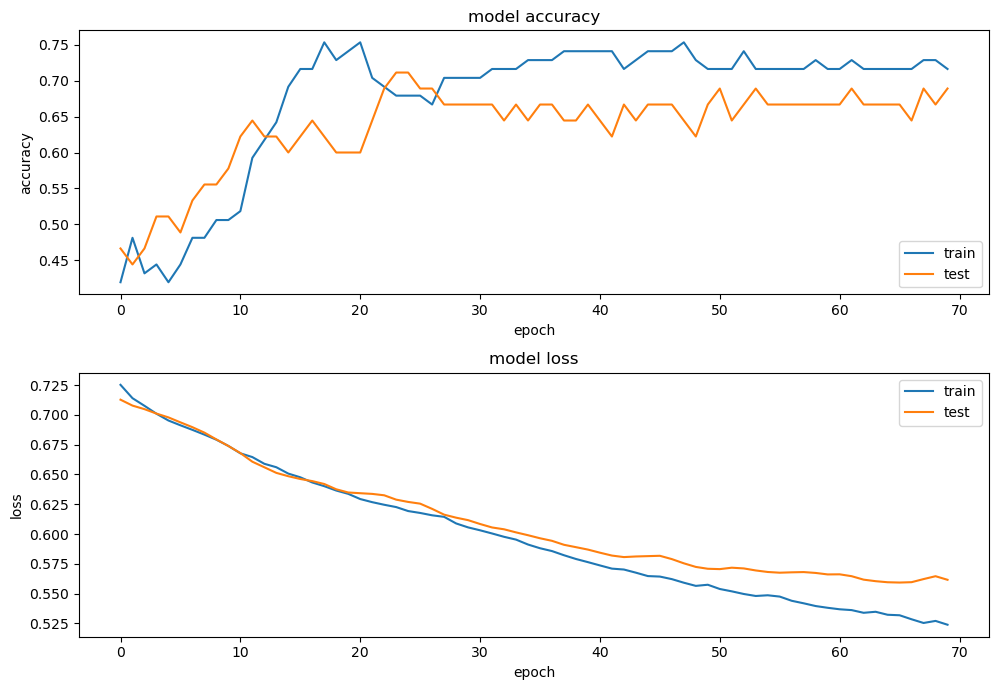

In [ ]:
# plotting the metrics
plt.figure(figsize=(10, 7))
plt.subplot(2,1,1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')

plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.tight_layout()

In [ ]:
predicted_classes = np.argmax(model2.predict(X_test),axis=0)
print(predicted_classes)

2/2 [==============================] - 0s 2ms/step
[ 2 23]


# **Classified Wavelet tranform**

In [ ]:
import numpy as np

# Access the data attribute of the TFR object
tfr_data = tfr.data
print(tfr_data)

# Convert the TFR data to a numpy array
tfr_array1 = np.array(tfr_data)

print(tfr_array1.shape)
print(tfr_array1.size)
# print(tfr_array1)

# Print the numpy array
# print(tfr_array)
# Split data into training and test sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(,reshaped_data y, test_size = 0.2, random_state = 42)

print("X_train :", X_train1)

SyntaxError: invalid syntax (2406593721.py, line 17)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC 
from sklearn.metrics import classification_report

# Create and fit the logistic regression model within a pipeline
clf = Pipeline([('LR', LogisticRegression())])
clf.fit(X_train, y_train)

# Predict and calculate accuracy
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

report = classification_report(y_test, y_pred, target_names=['rest', 'left','right'])  
print(report)

Accuracy: 0.5882352941176471
              precision    recall  f1-score   support

        rest       0.50      0.86      0.63         7
        left       1.00      0.29      0.44         7
       right       0.67      0.67      0.67         3

    accuracy                           0.59        17
   macro avg       0.72      0.60      0.58        17
weighted avg       0.74      0.59      0.56        17



In [62]:
import pandas as pd

# load the dataset
df = pd.read_csv('mdlon.csv')
df.head()

,at1,at2,at3,at4,at5,at6,at7,at8,at9,at10,...,at492,at493,at494,at495,at496,at497,at498,at499,at500,T
0,485,477,537,479,452,471,491,476,475,473,...,481,477,485,511,485,481,479,475,496,-1
1,483,458,460,487,587,475,526,479,485,469,...,478,487,338,513,486,483,492,510,517,-1
2,487,542,499,468,448,471,442,478,480,477,...,481,492,650,506,501,480,489,499,498,-1
3,480,491,510,485,495,472,417,474,502,476,...,480,474,572,454,469,475,482,494,461,1
4,484,502,528,489,466,481,402,478,487,468,...,479,452,435,486,508,481,504,495,511,1


In [63]:
import numpy as np

# name of the label (can be seen in the dataframe)
label = 'T'

# list with feature names (V1, V2, V3, ...)
features = df.columns.tolist()
features.remove(label)

# change class labeling to 0 and 1
df[label] = np.where( df[label] > 0, 1, 0)
df.head()

,at1,at2,at3,at4,at5,at6,at7,at8,at9,at10,...,at492,at493,at494,at495,at496,at497,at498,at499,at500,T
0,485,477,537,479,452,471,491,476,475,473,...,481,477,485,511,485,481,479,475,496,0
1,483,458,460,487,587,475,526,479,485,469,...,478,487,338,513,486,483,492,510,517,0
2,487,542,499,468,448,471,442,478,480,477,...,481,492,650,506,501,480,489,499,498,0
3,480,491,510,485,495,472,417,474,502,476,...,480,474,572,454,469,475,482,494,461,1
4,484,502,528,489,466,481,402,478,487,468,...,479,452,435,486,508,481,504,495,511,1


In [64]:
from scipy.stats import pointbiserialr
from math import sqrt

def getMerit(subset, label):
    k = len(subset)

    # average feature-class correlation
    rcf_all = []
    for feature in subset:
        coeff = pointbiserialr( df[label], df[feature] )
        rcf_all.append( abs( coeff.correlation ) )
    rcf = np.mean( rcf_all )

    # average feature-feature correlation
    corr = df[subset].corr()
    corr.values[np.tril_indices_from(corr.values)] = np.nan
    corr = abs(corr)
    rff = corr.unstack().mean()

    return (k * rcf) / sqrt(k + k * (k-1) * rff)

In [65]:
subset = ['at1', 'at2', 'at3', 'at4']
corr = df[subset].corr()
corr

,at1,at2,at3,at4
at1,1.000000,0.042789,-0.022897,0.017871
at2,0.042789,1.000000,-0.008173,0.020494
at3,-0.022897,-0.008173,1.000000,-0.009640
at4,0.017871,0.020494,-0.009640,1.000000


In [66]:
corr.values[np.tril_indices_from(corr.values)] = np.nan
corr

,at1,at2,at3,at4
at1,NaN,0.042789,-0.022897,0.017871
at2,NaN,NaN,-0.008173,0.020494
at3,NaN,NaN,NaN,-0.009640
at4,NaN,NaN,NaN,NaN


In [67]:
best_value = -1
best_feature = ''
for feature in features:
    coeff = pointbiserialr( df[label], df[feature] )
    abs_coeff = abs( coeff.correlation )
    if abs_coeff > best_value:
        best_value = abs_coeff
        best_feature = feature

print("Feature %s with merit %.4f"%(best_feature, best_value))

# Output: Feature V476 with merit 0.2255

Feature at476 with merit 0.2199


In [68]:
class PriorityQueue:
    def  __init__(self):
        self.queue = []

    def isEmpty(self):
        return len(self.queue) == 0
    
    def push(self, item, priority):
        """
        item already in priority queue with smaller priority:
        -> update its priority
        item already in priority queue with higher priority:
        -> do nothing
        if item not in priority queue:
        -> push it
        """
        for index, (i, p) in enumerate(self.queue):
            if (set(i) == set(item)):
                if (p >= priority):
                    break
                del self.queue[index]
                self.queue.append( (item, priority) )
                break
        else:
            self.queue.append( (item, priority) )
        
    def pop(self):
        # return item with highest priority and remove it from queue
        max_idx = 0
        for index, (i, p) in enumerate(self.queue):
            if (self.queue[max_idx][1] < p):
                max_idx = index
        (item, priority) = self.queue[max_idx]
        del self.queue[max_idx]
        return (item, priority)

In [69]:
# initialize queue
queue = PriorityQueue()

# push first tuple (subset, merit)
queue.push([best_feature], best_value)

In [70]:
# list for visited nodes
visited = []

# counter for backtracks
n_backtrack = 0

# limit of backtracks
max_backtrack = 5
print(queue)

In [74]:
# repeat until queue is empty
# or the maximum number of backtracks is reached
while not queue.isEmpty():
    # get element of queue with highest merit
    subset, priority = queue.pop()
    
    # check whether the priority of this subset
    # is higher than the current best subset
    if (priority < best_value):
        n_backtrack += 1
    else:
        best_value = priority
        best_subset = subset

    # goal condition
    if (n_backtrack == max_backtrack):
        break

    
    # iterate through all features and look of one can
    # increase the merit
    for feature in features:
        temp_subset = subset + [feature]
        
        # check if this subset has already been evaluated
        for node in visited:
            if (set(node) == set(temp_subset)):
                break
        # if not, ...
        else:
            # ... mark it as visited
            visited.append( temp_subset )
            # ... compute merit
            merit = getMerit(temp_subset, label)
            # and push it to the queue
            queue.push(temp_subset, merit)
        
        print(best_subset)
        print(merit)

['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.2607148365559684
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.26393882965680676
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.2624921000296499
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.25983884613532027
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.26800686604228663
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.26730412589905395
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.26411

['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.2674734676230001
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.2644031246895709
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.2641224663308653
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.2643529015413946
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.26352735536696886
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.26041250053489645
['at476', 'at49', 'at242', 'at324', 'at206', 'at283', 'at297', 'at425', 'at431', 'at56', 'at337', 'at205', 'at330', 'at200']
0.2669599

KeyboardInterrupt: 

In [53]:
from sklearn.model_selection import cross_val_score
from sklearn import svm
import time

# predictors
X = df[features].to_numpy()
# target
Y = df[label].to_numpy()

# get timing
t0 = time.time()

# run SVM with 10-fold cross validation
svc = svm.SVC(kernel='rbf', C=100, gamma=0.01, random_state=42)
scores = cross_val_score(svc, X, Y, cv=10)
best_score = np.mean( scores )

print("Score: %.2f%% (Time: %.4f s)"%(best_score*100, time.time() - t0))

# Output
# Score: 50.00% (Time: 40.1259 s)

Score: 50.00% (Time: 4.5511 s)


In [57]:
# predictors
print(len(best_subset))
X = df[best_subset].to_numpy()

# get timing
t0 = time.time()

# run SVM with 10-fold cross validation
svc = svm.SVC(kernel='rbf', C=100, gamma=0.01, random_state=42)
scores_subset = cross_val_score(svc, X, Y, cv=10)
best_score = np.mean( scores_subset )

print("Score: %.2f%% (Time: %.4f s)"%(best_score*100, time.time() - t0))

# Output
# Score: 66.50% (Time: 5.8936 s)

60


Score: 75.05% (Time: 1.8777 s)
